In [133]:
import sys
sys.path.append('/project/FoolingDetection/pytorch')

import importlib
import lib.VisualizationProvider
import lib.FeatureProvider
import lib.StaticMetricProvider
importlib.reload(lib.VisualizationProvider)
importlib.reload(lib.FeatureProvider)
importlib.reload(lib.StaticMetricProvider)

from lib.VisualizationProvider import (plot_2d_distributions, 
                                       plot_2d_distributions2,
                                       plot_scatter, 
                                       plot_scatter2,
                                       plot_gaussian_distributions,
                                       plot_heatmap,
                                       plot_comparison_heatmaps
                                      )

from lib.FeatureProvider import (load_all_grids, 
                                 load_all_grids_randparams,
                                 reduce_dimensionality_umap, 
                                 reduce_dimensionality_kpca, 
                                 reduce_dimensionality_tsne
                                )

from lib.StaticMetricProvider import (test_all_introspection_technique_combinations, 
                                      calc_distributions, 
                                      get_values_from_distance_matrix, 
                                      difference_distances, 
                                      apply_log_to_distances,
                                      calculate_stats
                                     )
from umap import UMAP
from sklearn.manifold import TSNE
from sklearn.decomposition import KernelPCA

# Base Code 

In [2]:
MODEL_TYPE = "cnn"
DATASET = "cifar10"
ATTACK1 = "correct"
ATTACK2 = "RandLabels"
ATTACK3 = "RandParams/Cascading/20_Conv2d"
MAX_IMAGES = 300
RANDOM_STATE = 42
NUMBER_COMPONENTS = 2

In [3]:
all_grids_1 = load_all_grids(
    model_type=MODEL_TYPE, 
    dataset=DATASET, 
    attack=ATTACK1, 
    max_images=MAX_IMAGES
)
all_grids_2 = load_all_grids(
    model_type=MODEL_TYPE, 
    dataset=DATASET, 
    attack=ATTACK2, 
    max_images=MAX_IMAGES
)

all_grids_3 = load_all_grids(
    model_type=MODEL_TYPE, 
    dataset=DATASET, 
    attack=ATTACK3, 
    max_images=MAX_IMAGES
)

distances_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_NoAttacked_RandLabels = difference_distances(
    reference=distances_1, 
    delta=distances_2, 
    fold_change_and_log_scale=True
)

difference_NoAttacked_RandParams = difference_distances(
    reference=distances_1, 
    delta=distances_3, 
    fold_change_and_log_scale=True
)

Loading grids from disk...
Loading image 50 out of 300 (16.67%)
Loading image 100 out of 300 (33.33%)
Loading image 150 out of 300 (50.00%)
Loading image 200 out of 300 (66.67%)
Loading image 250 out of 300 (83.33%)
Loading image 300 out of 300 (100.00%)
Loading grids from disk...
Loading image 50 out of 300 (16.67%)
Loading image 100 out of 300 (33.33%)
Loading image 150 out of 300 (50.00%)
Loading image 200 out of 300 (66.67%)
Loading image 250 out of 300 (83.33%)
Loading image 300 out of 300 (100.00%)
Loading grids from disk...
Loading image 50 out of 300 (16.67%)
Loading image 100 out of 300 (33.33%)
Loading image 150 out of 300 (50.00%)
Loading image 200 out of 300 (66.67%)
Loading image 250 out of 300 (83.33%)
Loading image 300 out of 300 (100.00%)
Loading grids from disk...
Loading image 50 out of 300 (16.67%)
Loading image 100 out of 300 (33.33%)
Loading image 150 out of 300 (50.00%)
Loading image 200 out of 300 (66.67%)
Loading image 250 out of 300 (83.33%)
Loading image 300 o

In [4]:
# UMap Reducer Object
umap_reducer = UMAP(n_components=NUMBER_COMPONENTS, random_state=RANDOM_STATE)


# UMap Transform
all_grids_1_umap = reduce_dimensionality_umap(all_grids_1, umap_reducer)
all_grids_2_umap = reduce_dimensionality_umap(all_grids_2, umap_reducer)
all_grids_3_umap = reduce_dimensionality_umap(all_grids_3, umap_reducer)


distances_umap_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1_umap, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_umap_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2_umap, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_umap_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3_umap, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_umap_NoAttacked_RandLabels = difference_distances(
    reference=distances_umap_1, 
    delta=distances_umap_2, 
    fold_change_and_log_scale=True
)

difference_umap_NoAttacked_RandParams = difference_distances(
    reference=distances_umap_1, 
    delta=distances_umap_3, 
    fold_change_and_log_scale=True
)

Reducing dimensionality for technique backprop...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique dl...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique g_t_i...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique ig...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique vgrads...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique backprop...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique dl...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique g_t_i...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique ig...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique vgrads...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique backprop...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique dl...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique g_t_i...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique ig...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique vgrads...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [5]:
# TSNE Reducer Object
tsne_reducer = TSNE(n_components=NUMBER_COMPONENTS, random_state=RANDOM_STATE, n_jobs=-1)

# TSNE Transform
all_grids_1_tsne =reduce_dimensionality_tsne(all_grids_1, tsne_reducer)
all_grids_2_tsne =reduce_dimensionality_tsne(all_grids_2, tsne_reducer)
all_grids_3_tsne =reduce_dimensionality_tsne(all_grids_3, tsne_reducer)

distances_tsne_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1_tsne, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_tsne_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2_tsne, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_tsne_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3_tsne, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_tsne_NoAttacked_RandLabels = difference_distances(
    reference=distances_tsne_1, 
    delta=distances_tsne_2, 
    fold_change_and_log_scale=True
)

difference_tsne_NoAttacked_RandParams = difference_distances(
    reference=distances_tsne_1, 
    delta=distances_tsne_3, 
    fold_change_and_log_scale=True
)

Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...


In [6]:
# kPCA Transform
# kPCA-Linear Reducer Object
kpca_linear_reducer = KernelPCA(
        n_components=NUMBER_COMPONENTS, 
        kernel="linear", 
        gamma=.1, 
        eigen_solver="auto", 
        random_state=RANDOM_STATE, 
        alpha=10)

# Linear kernel
all_grids_1_kpca_linear = reduce_dimensionality_kpca(all_grids_1, kpca_linear_reducer)
all_grids_2_kpca_linear = reduce_dimensionality_kpca(all_grids_2, kpca_linear_reducer)
all_grids_3_kpca_linear = reduce_dimensionality_kpca(all_grids_3, kpca_linear_reducer)

distances_kcpa_linear_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1_kpca_linear, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_linear_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2_kpca_linear, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_linear_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3_kpca_linear, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_kpca_linear_NoAttacked_RandLabels = difference_distances(
    reference=distances_kcpa_linear_1, 
    delta=distances_kcpa_linear_2, 
    fold_change_and_log_scale=True
)

difference_kpca_linear_NoAttacked_RandParams = difference_distances(
    reference=distances_kcpa_linear_1, 
    delta=distances_kcpa_linear_3, 
    fold_change_and_log_scale=True
)

# Poly kernel

# kPCA-Poly Reducer Object
kpca_poly_reducer = KernelPCA(
        n_components=NUMBER_COMPONENTS, 
        kernel="poly", 
        gamma=.1, 
        eigen_solver="auto", 
        random_state=RANDOM_STATE, 
        alpha=10)

all_grids_1_kpca_poly = reduce_dimensionality_kpca(all_grids_1, kpca_poly_reducer)
all_grids_2_kpca_poly = reduce_dimensionality_kpca(all_grids_2, kpca_poly_reducer)
all_grids_3_kpca_poly = reduce_dimensionality_kpca(all_grids_3, kpca_poly_reducer)

distances_kcpa_poly_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1_kpca_poly, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_poly_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2_kpca_poly, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_poly_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3_kpca_poly, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_kpca_poly_NoAttacked_RandLabels = difference_distances(
    reference=distances_kcpa_poly_1, 
    delta=distances_kcpa_poly_2, 
    fold_change_and_log_scale=True
)

difference_kpca_poly_NoAttacked_RandParams = difference_distances(
    reference=distances_kcpa_poly_1, 
    delta=distances_kcpa_poly_3, 
    fold_change_and_log_scale=True
)

# Cosine kernel
# kPCA-Cosine Reducer Object
kpca_cosine_reducer = KernelPCA(
        n_components=NUMBER_COMPONENTS, 
        kernel="cosine", 
        gamma=.1, 
        eigen_solver="auto", 
        random_state=RANDOM_STATE, 
        alpha=10)

all_grids_1_kpca_cosine = reduce_dimensionality_kpca(all_grids_1, kpca_cosine_reducer)
all_grids_2_kpca_cosine = reduce_dimensionality_kpca(all_grids_2, kpca_cosine_reducer)
all_grids_3_kpca_cosine = reduce_dimensionality_kpca(all_grids_3, kpca_cosine_reducer)

distances_kcpa_cosine_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1_kpca_cosine, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_cosine_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2_kpca_cosine, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_cosine_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3_kpca_cosine, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_kpca_cosine_NoAttacked_RandLabels = difference_distances(
    reference=distances_kcpa_cosine_1, 
    delta=distances_kcpa_cosine_2, 
    fold_change_and_log_scale=True
)

difference_kpca_cosine_NoAttacked_RandParams = difference_distances(
    reference=distances_kcpa_cosine_1, 
    delta=distances_kcpa_cosine_3, 
    fold_change_and_log_scale=True
)

Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimension

# Lower-Dimensional Comparison (Aggregated)
Map the unattacked and an attacked version to a lower_dim space (n=2) and see how the distributions in this lower-dim space differ!

## Normal (Left) vs. RandLabels (Middle) vs. RandParams (Right)

### UMap

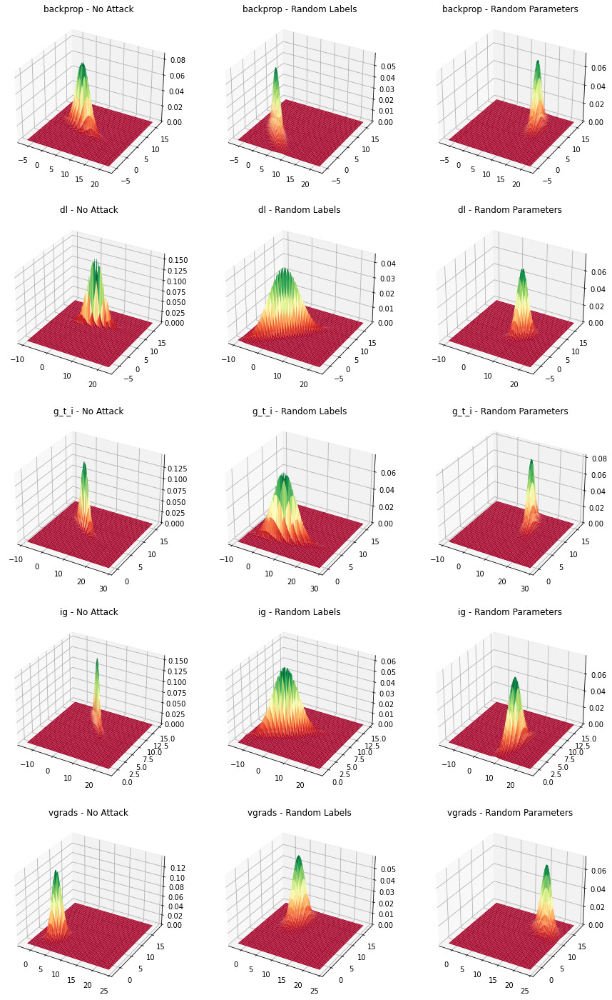

In [197]:
plot_2d_distributions2(all_grids_1_umap, all_grids_2_umap, all_grids_3_umap, title1="No Attack", title2="Random Labels", title3="Random Parameters")

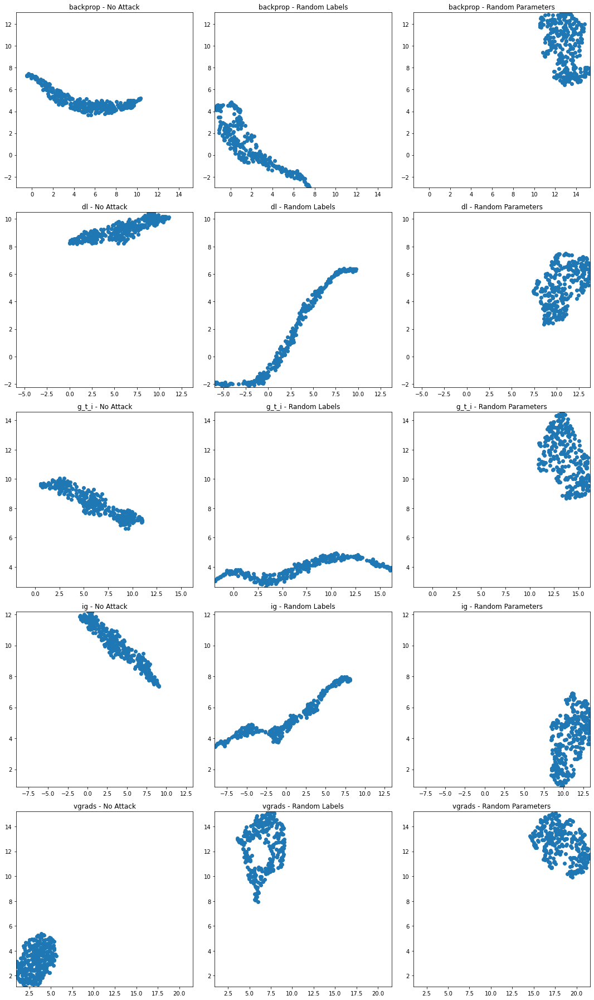

In [198]:
plot_scatter2(all_grids_1_umap, all_grids_2_umap, all_grids_3_umap, title1="No Attack", title2="Random Labels", title3="Random Parameters")

In [199]:
calculate_stats(all_grids_1_umap, all_grids_2_umap,  all_grids_3_umap)

,Technique,Grid,Mean(1),Standard Deviation(1),Mean(2),Standard Deviation(2)
0,backprop,Grids 1,4.874250,2.989691,5.066913,0.927334
1,backprop,Grids 2,2.127744,2.516867,0.804712,2.145741
2,backprop,Grids 3,12.950679,1.143081,9.950108,2.004721
3,dl,Grids 1,5.628954,3.011403,9.217560,0.615584
4,dl,Grids 2,2.340724,4.039229,1.638389,2.989744
5,dl,Grids 3,10.694752,1.671939,5.155020,1.394883
6,g_t_i,Grids 1,5.934439,2.873227,8.405569,0.908345
7,g_t_i,Grids 2,6.807037,4.944695,3.858191,0.582609
8,g_t_i,Grids 3,13.689681,1.389129,11.445778,1.567590
9,ig,Grids 1,3.876108,2.797981,9.945499,1.263963


### kPCA (Linear)

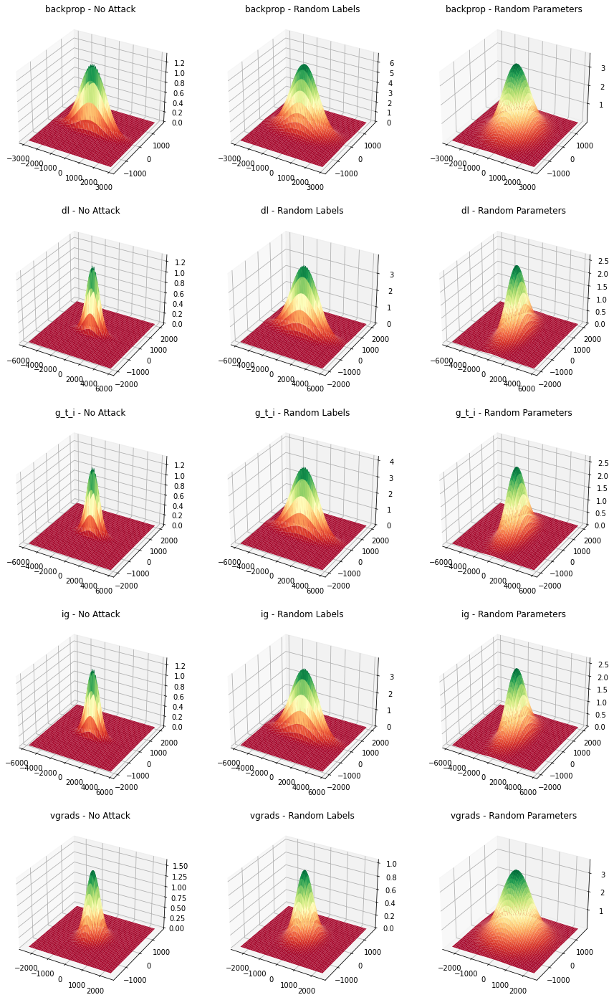

In [200]:
plot_2d_distributions2(all_grids_1_kpca_linear, all_grids_2_kpca_linear, all_grids_3_kpca_linear, title1="No Attack", title2="Random Labels", title3="Random Parameters")

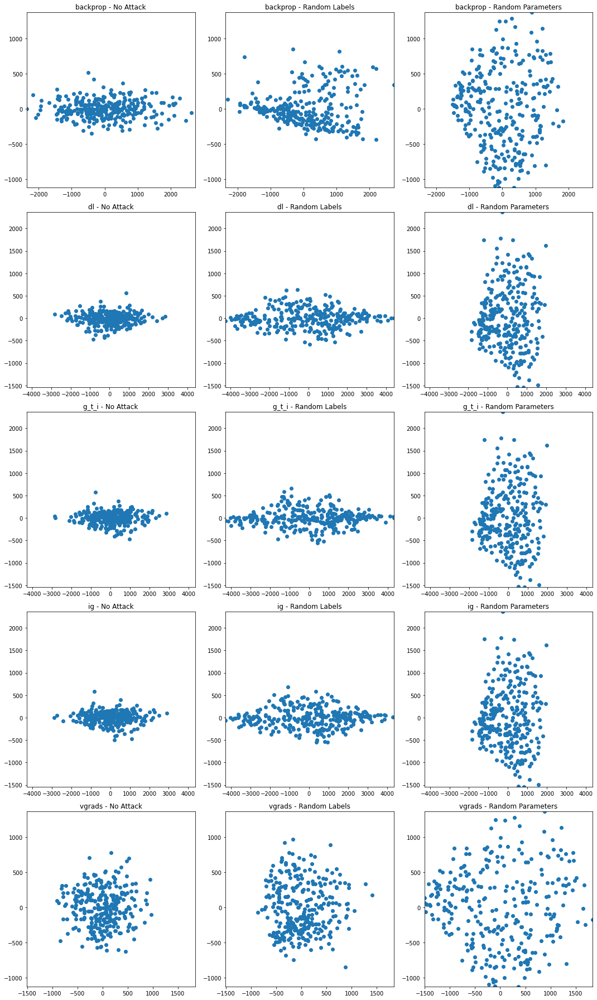

In [201]:
plot_scatter2(all_grids_1_kpca_linear, all_grids_2_kpca_linear, all_grids_3_kpca_linear, title1="No Attack", title2="Random Labels", title3="Random Parameters")

In [202]:
calculate_stats(all_grids_1_kpca_linear, all_grids_2_kpca_linear, all_grids_3_kpca_linear)

,Technique,Grid,Mean(1),Standard Deviation(1),Mean(2),Standard Deviation(2)
0,backprop,Grids 1,-1.030761e-13,915.642559,-7.814075e-13,129.418634
1,backprop,Grids 2,2.167629e-13,963.820630,-5.729817e-13,245.681717
2,backprop,Grids 3,7.275958e-14,799.579547,-1.818989e-14,544.325862
3,dl,Grids 1,0.000000e+00,919.940453,1.849306e-13,133.332694
4,dl,Grids 2,4.850638e-14,1931.388851,-1.423359e-12,205.510213
5,dl,Grids 3,4.244309e-14,882.977339,-6.669628e-14,678.775864
6,g_t_i,Grids 1,-1.030761e-13,896.950468,-6.563520e-13,133.291945
7,g_t_i,Grids 2,-1.212660e-14,1921.935649,-1.818989e-14,199.092143
8,g_t_i,Grids 3,1.212660e-14,882.977346,0.000000e+00,678.775743
9,ig,Grids 1,1.182343e-13,904.886560,7.260799e-13,134.991199


### kPCA (poly)

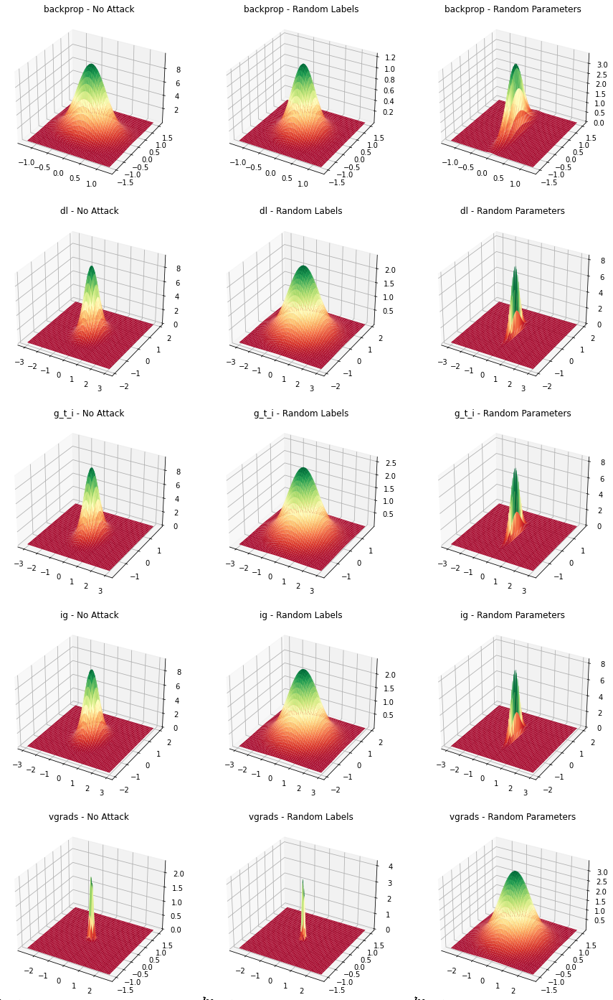

In [203]:
plot_2d_distributions2(all_grids_1_kpca_poly, all_grids_2_kpca_poly, all_grids_3_kpca_poly, title1="No Attack", title2="Random Labels", title3="Random Parameters")

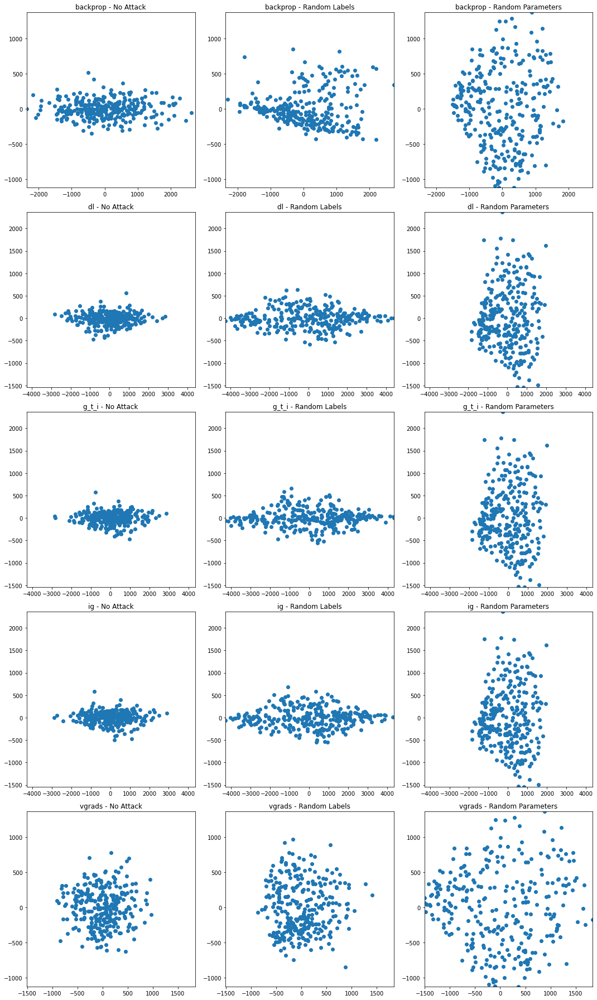

In [204]:
plot_scatter2(all_grids_1_kpca_linear, all_grids_2_kpca_linear, all_grids_3_kpca_linear, title1="No Attack", title2="Random Labels", title3="Random Parameters")

In [205]:
calculate_stats(all_grids_1_kpca_linear, all_grids_2_kpca_linear, all_grids_3_kpca_linear)

,Technique,Grid,Mean(1),Standard Deviation(1),Mean(2),Standard Deviation(2)
0,backprop,Grids 1,-1.030761e-13,915.642559,-7.814075e-13,129.418634
1,backprop,Grids 2,2.167629e-13,963.820630,-5.729817e-13,245.681717
2,backprop,Grids 3,7.275958e-14,799.579547,-1.818989e-14,544.325862
3,dl,Grids 1,0.000000e+00,919.940453,1.849306e-13,133.332694
4,dl,Grids 2,4.850638e-14,1931.388851,-1.423359e-12,205.510213
5,dl,Grids 3,4.244309e-14,882.977339,-6.669628e-14,678.775864
6,g_t_i,Grids 1,-1.030761e-13,896.950468,-6.563520e-13,133.291945
7,g_t_i,Grids 2,-1.212660e-14,1921.935649,-1.818989e-14,199.092143
8,g_t_i,Grids 3,1.212660e-14,882.977346,0.000000e+00,678.775743
9,ig,Grids 1,1.182343e-13,904.886560,7.260799e-13,134.991199


### kPCA (cosine)

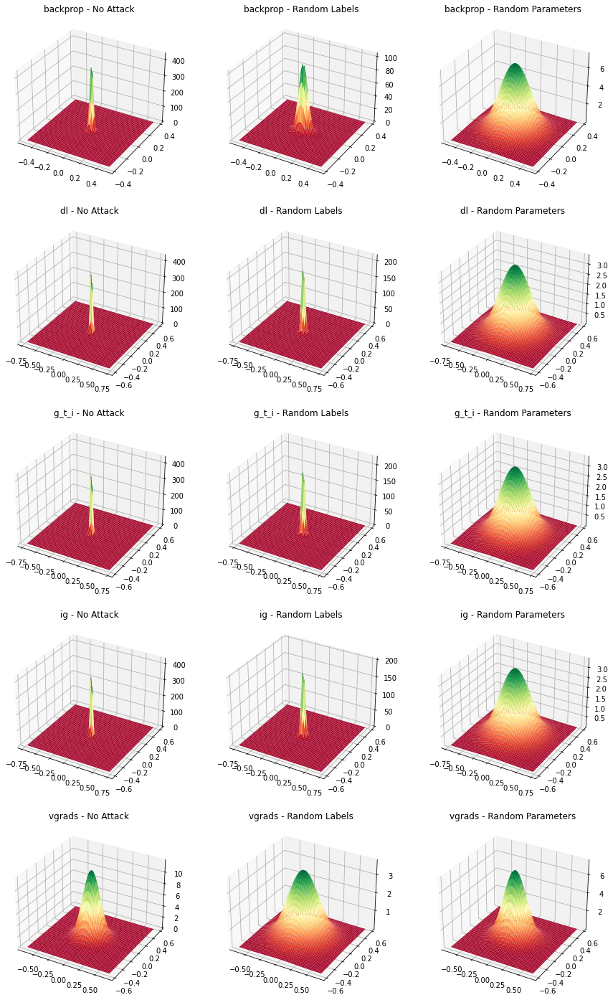

In [206]:
plot_2d_distributions2(all_grids_1_kpca_cosine, all_grids_2_kpca_cosine, all_grids_3_kpca_cosine, title1="No Attack", title2="Random Labels", title3="Random Parameters")

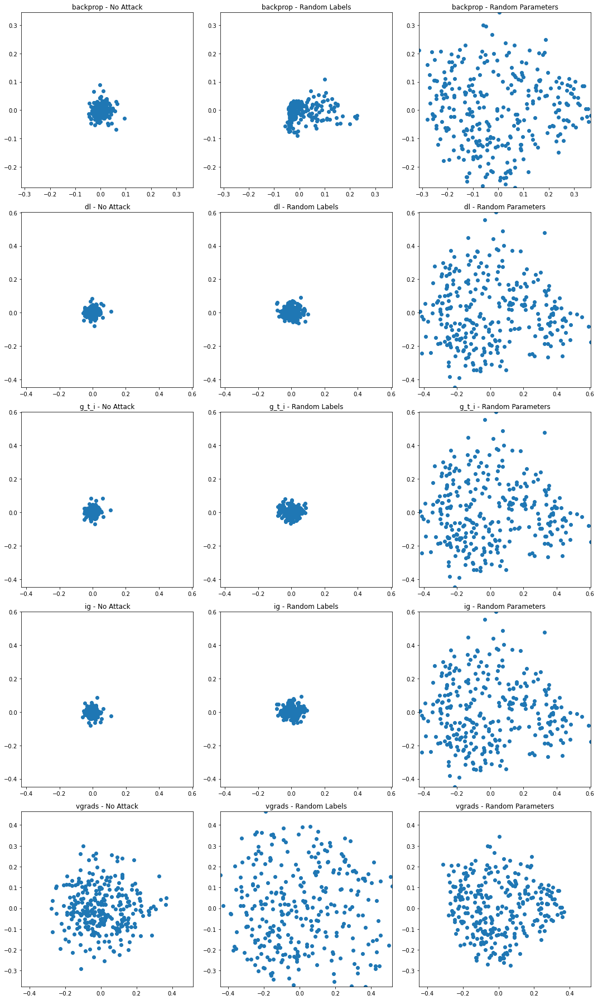

In [207]:
plot_scatter2(all_grids_1_kpca_cosine, all_grids_2_kpca_cosine, all_grids_3_kpca_cosine, title1="No Attack", title2="Random Labels", title3="Random Parameters")

In [208]:
calculate_stats(all_grids_1_kpca_cosine, all_grids_2_kpca_cosine, all_grids_3_kpca_cosine)

,Technique,Grid,Mean(1),Standard Deviation(1),Mean(2),Standard Deviation(2)
0,backprop,Grids 1,2.362647e-15,0.019761,2.893981e-16,0.018581
1,backprop,Grids 2,-2.923587e-17,0.054326,-1.774506e-16,0.028323
2,backprop,Grids 3,1.717145e-16,0.169109,2.708944e-16,0.126024
3,dl,Grids 1,-1.176836e-16,0.019609,1.125257e-15,0.018902
4,dl,Grids 2,-7.371881e-16,0.030441,-1.297111e-16,0.024346
5,dl,Grids 3,2.072416e-17,0.240403,-9.769963e-17,0.194446
6,g_t_i,Grids 1,1.523041e-15,0.019465,-3.405609e-16,0.018893
7,g_t_i,Grids 2,8.054668e-16,0.029791,1.697531e-15,0.023966
8,g_t_i,Grids 3,3.108624e-17,0.240403,-9.325873e-17,0.194446
9,ig,Grids 1,-6.426341e-16,0.019657,9.649226e-16,0.018980


### t-SNE

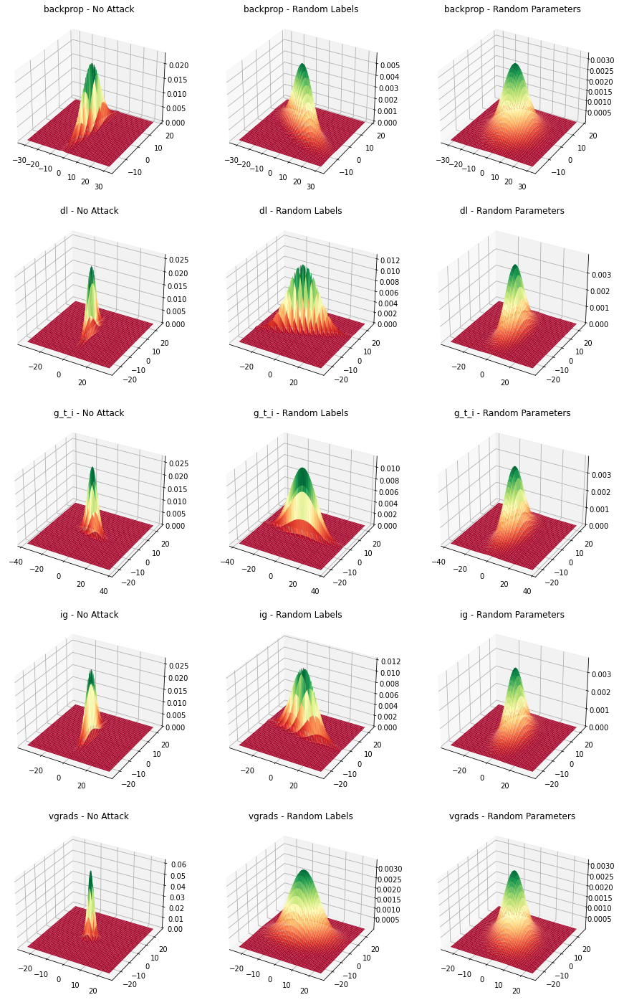

In [209]:
# (this execution works but takes ages...)
plot_2d_distributions2(all_grids_1_tsne, all_grids_2_tsne, all_grids_3_tsne, title1="No Attack", title2="Random Labels", title3="Random Parameters")

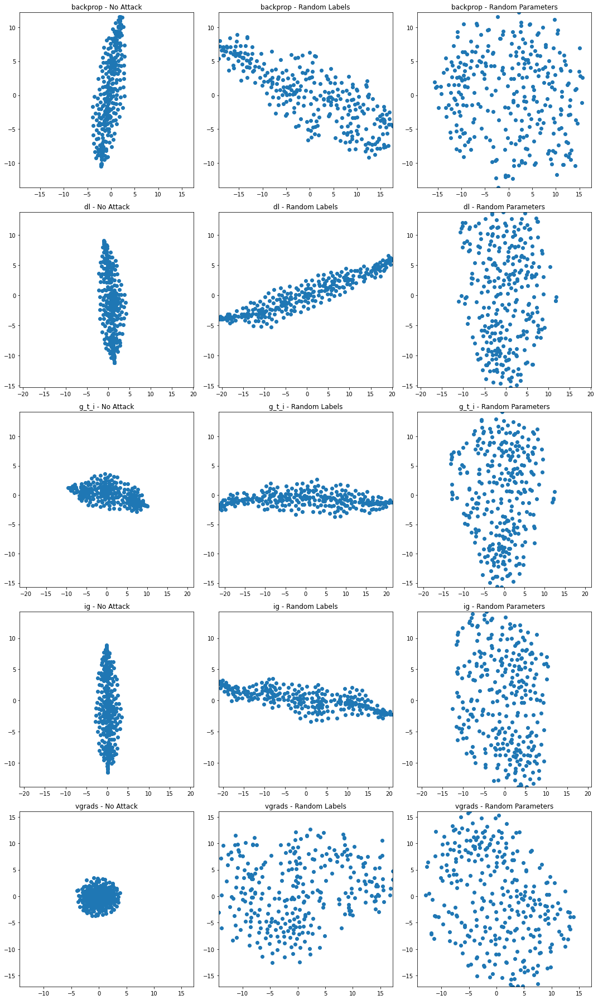

In [210]:
plot_scatter2(all_grids_1_tsne, all_grids_2_tsne, all_grids_3_tsne, title1="No Attack", title2="Random Labels", title3="Random Parameters")

In [211]:
calculate_stats(all_grids_1_tsne, all_grids_2_tsne, all_grids_3_tsne)

,Technique,Grid,Mean(1),Standard Deviation(1),Mean(2),Standard Deviation(2)
0,backprop,Grids 1,-0.322503,1.591700,0.424088,6.050703
1,backprop,Grids 2,0.196770,10.324927,0.075660,4.340696
2,backprop,Grids 3,0.260234,8.320921,0.190518,5.969411
3,dl,Grids 1,0.607211,1.242475,-1.124964,5.470120
4,dl,Grids 2,-0.284288,11.623944,0.158954,3.085927
5,dl,Grids 3,-0.250308,4.946047,-0.067241,8.036441
6,g_t_i,Grids 1,0.475955,5.309273,0.153374,1.309944
7,g_t_i,Grids 2,0.274235,12.258745,-0.829471,1.119675
8,g_t_i,Grids 3,-0.857577,5.376542,-0.050197,7.641288
9,ig,Grids 1,0.143966,1.096822,-1.436265,5.455268


# Per-Image Comparison 
For a combination of two Explanation Techniques (expl1, expl2) (e.g. expl1=DeepLift, expl2=vanillaGrads) compute the distance for each image in a **Lower and High Dimensional Space**. Finally, plot the distributions. 

This is also done for the difference of the distances. For this the distances for an attacked and non-attacked versions are calculated and then the difference is calculated using the fold_change on a logarithmic scale. Finally, this is plotted aswell.

In [212]:
METRIC="euclidean"

## High-Dimensional 

### No Attack

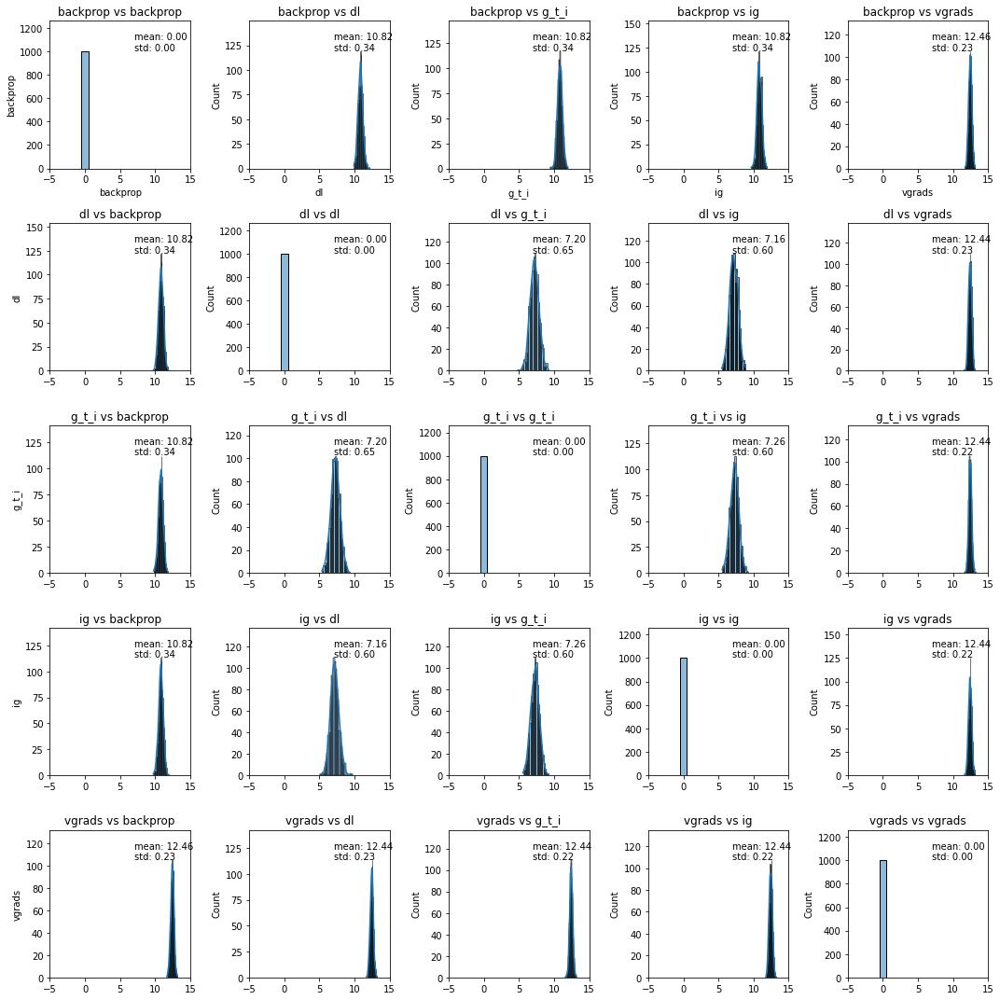

In [213]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_1), 
    techniques=list(techniques), 
    metric=METRIC,
    value_range=(-5, 15),
    save_name="Distributions_NoAttack_Mnist_cnn.png"

)

### RandLabels Attack

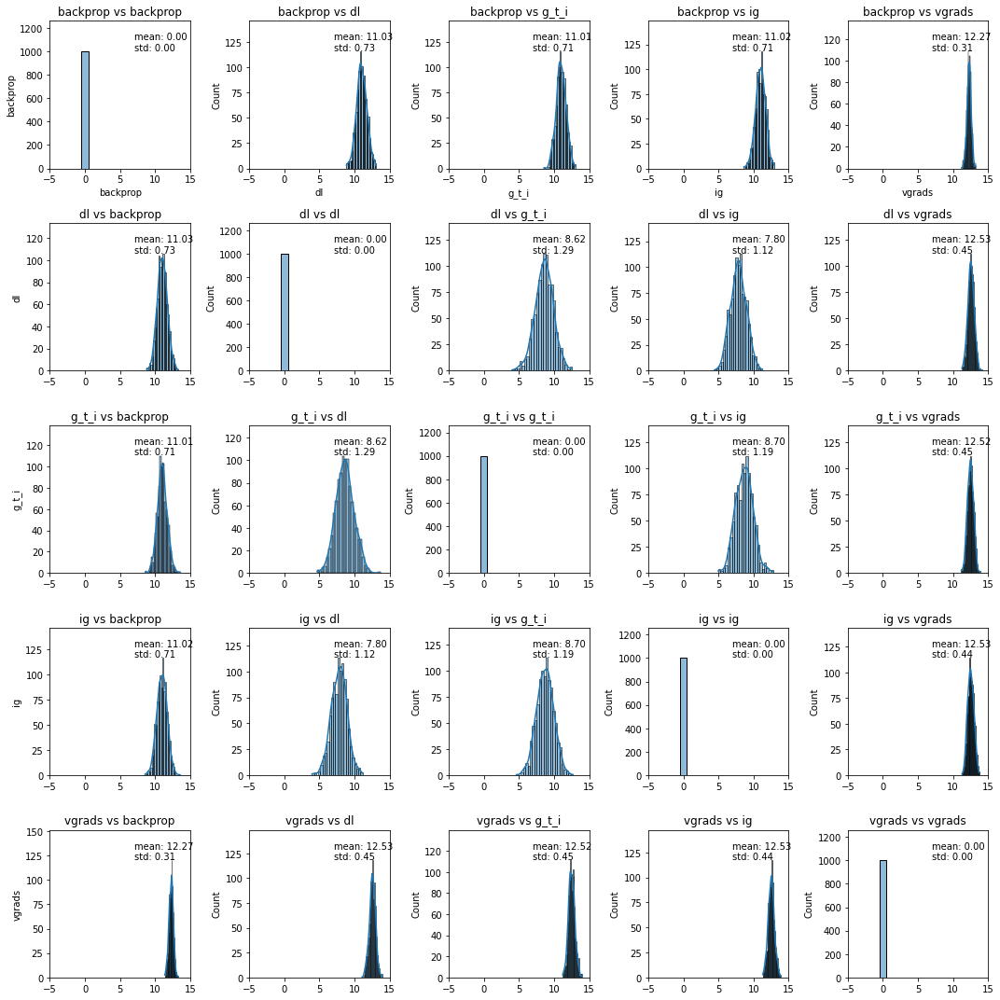

In [214]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_2), 
    techniques=list(techniques), 
    metric=METRIC,
    value_range=(-5, 15),
    save_name="Distributions_RandLabels_Mnist_cnn.png"
)

### RandParams Attack

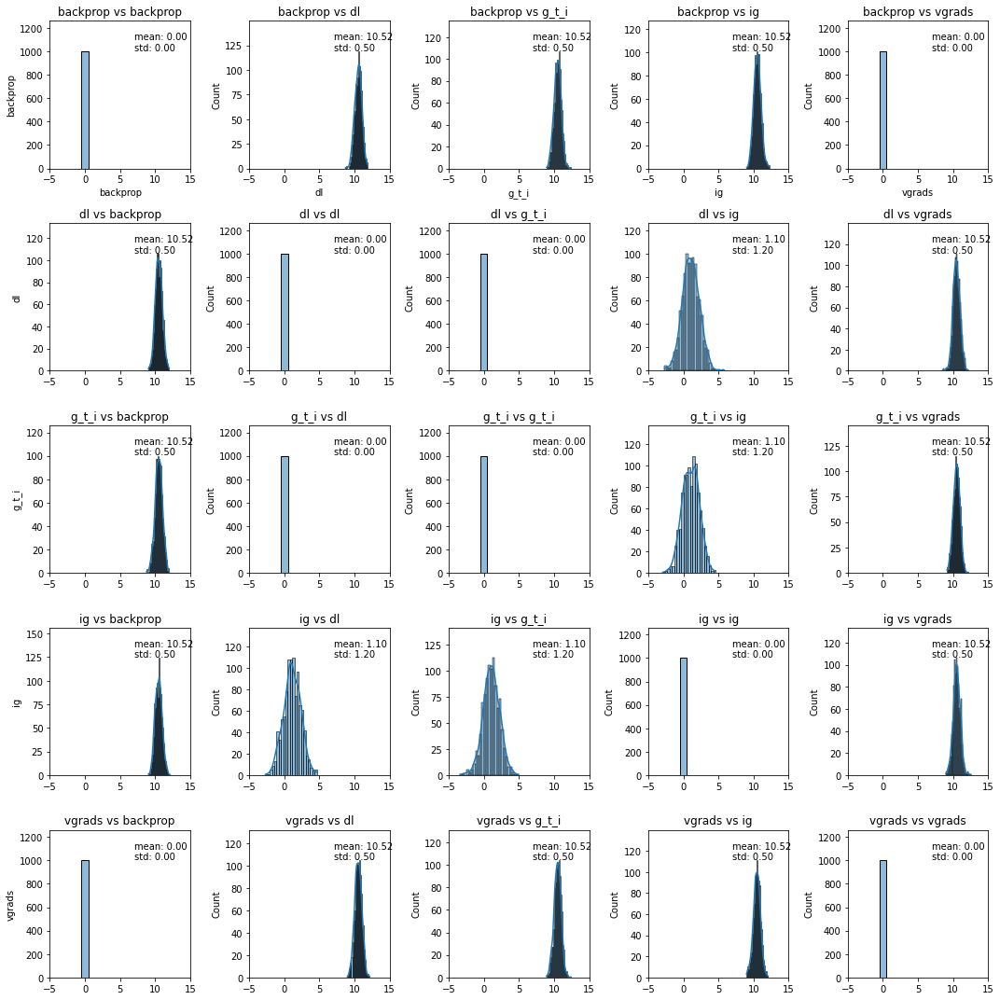

In [215]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_3), 
    techniques=list(techniques), 
    metric=METRIC,
    value_range=(-5, 15),
    save_name="Distributions_RandParams_Mnist_cnn.png"
)

### No Attack vs. RandLabels (Difference)

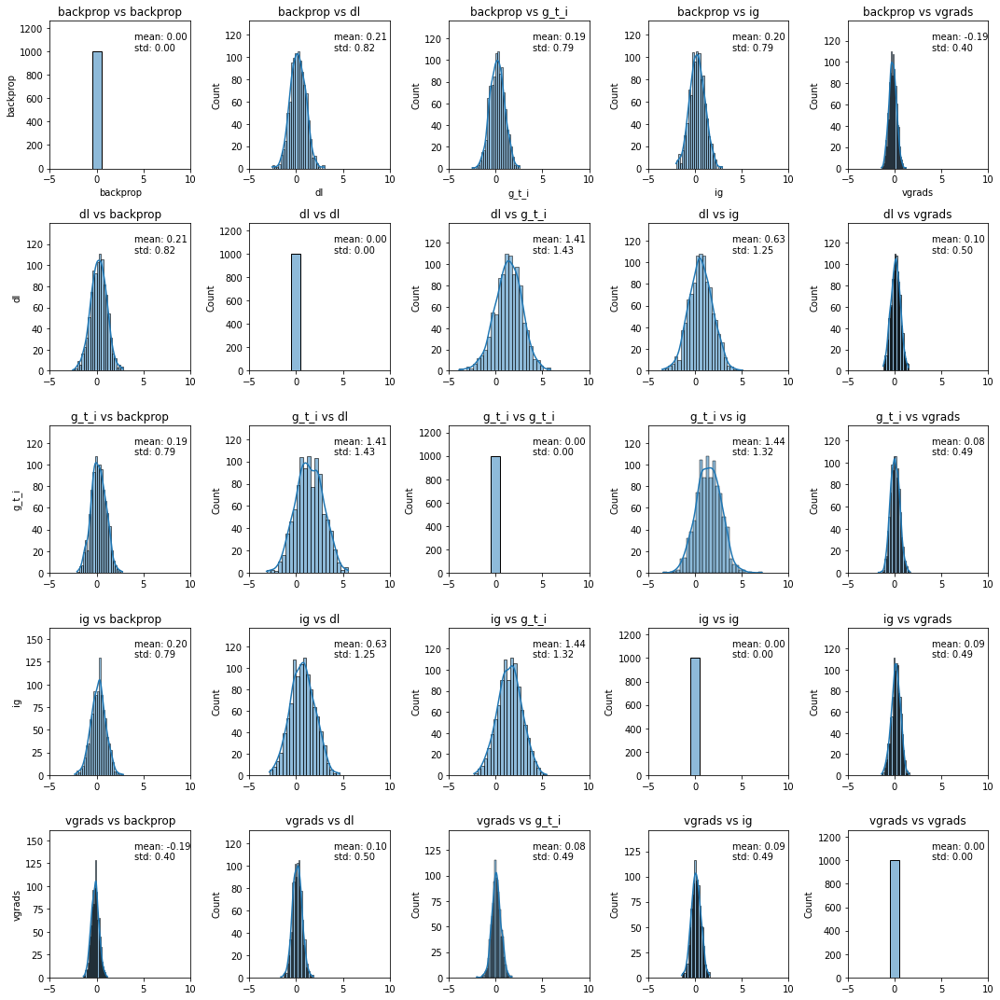

In [216]:
plot_gaussian_distributions(
    distances=difference_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC,
    value_range=(-5, 10),
    save_name="Distributions_NoAttack_RandLabels_Mnist_cnn_diff.png"
)

### No Attack vs. RandParams (Difference)

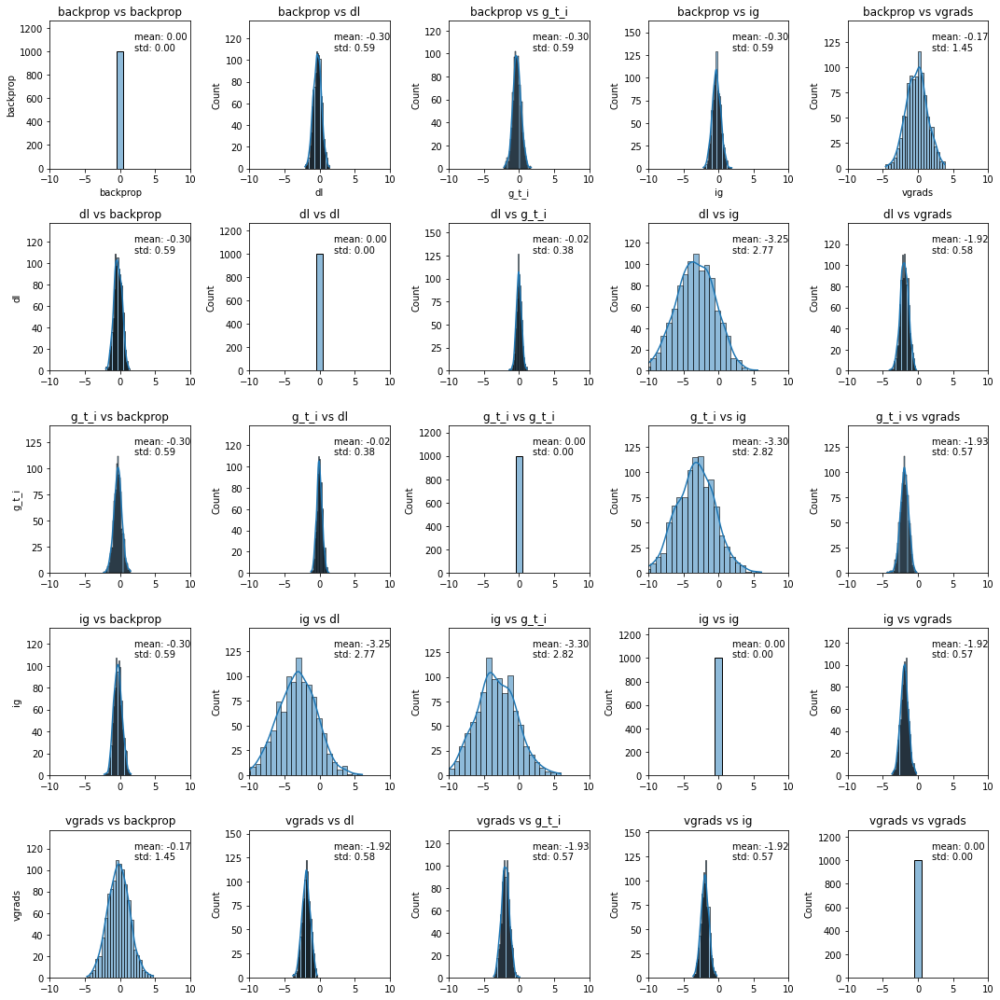

In [217]:
plot_gaussian_distributions(
    distances=difference_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC,
    value_range=(-10, 10),
    save_name="Distributions_NoAttack_RandParams_Mnist_cnn_diff.png"
)

## UMap

### No Attack

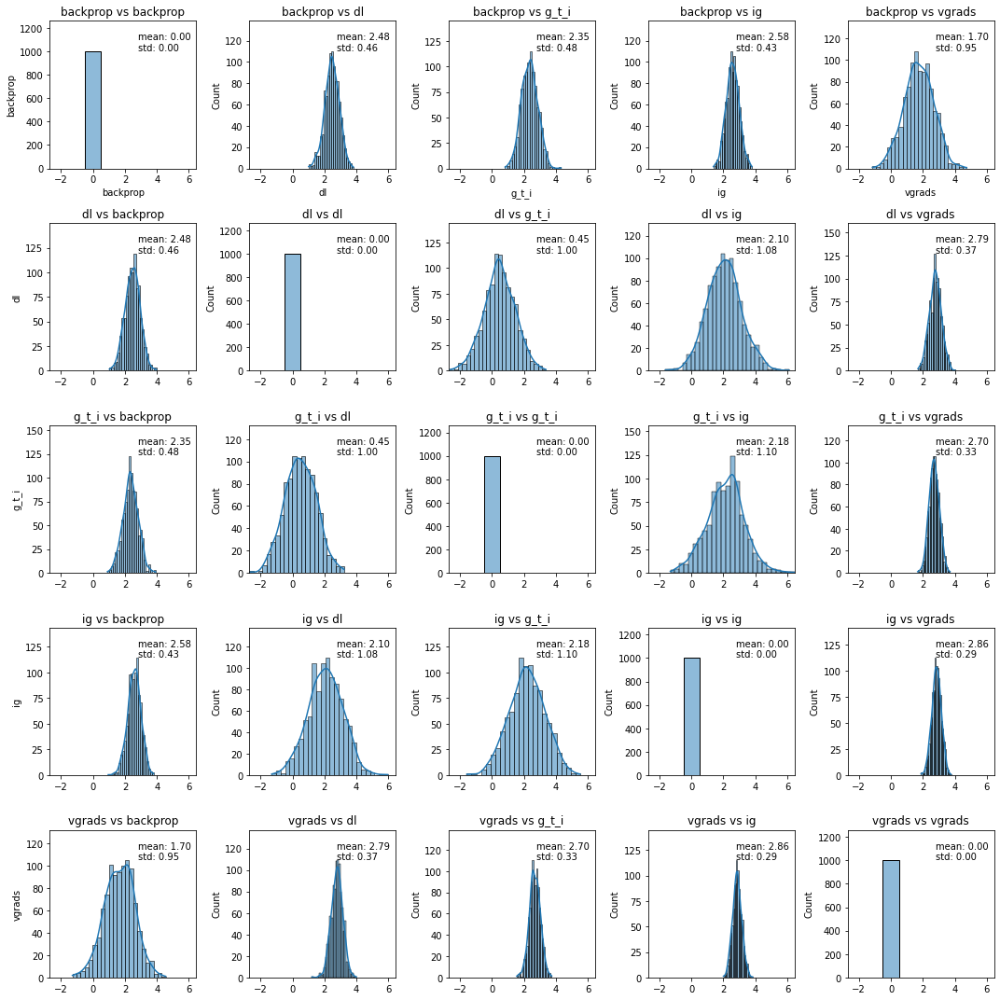

In [218]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_umap_1), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandLabels Attack

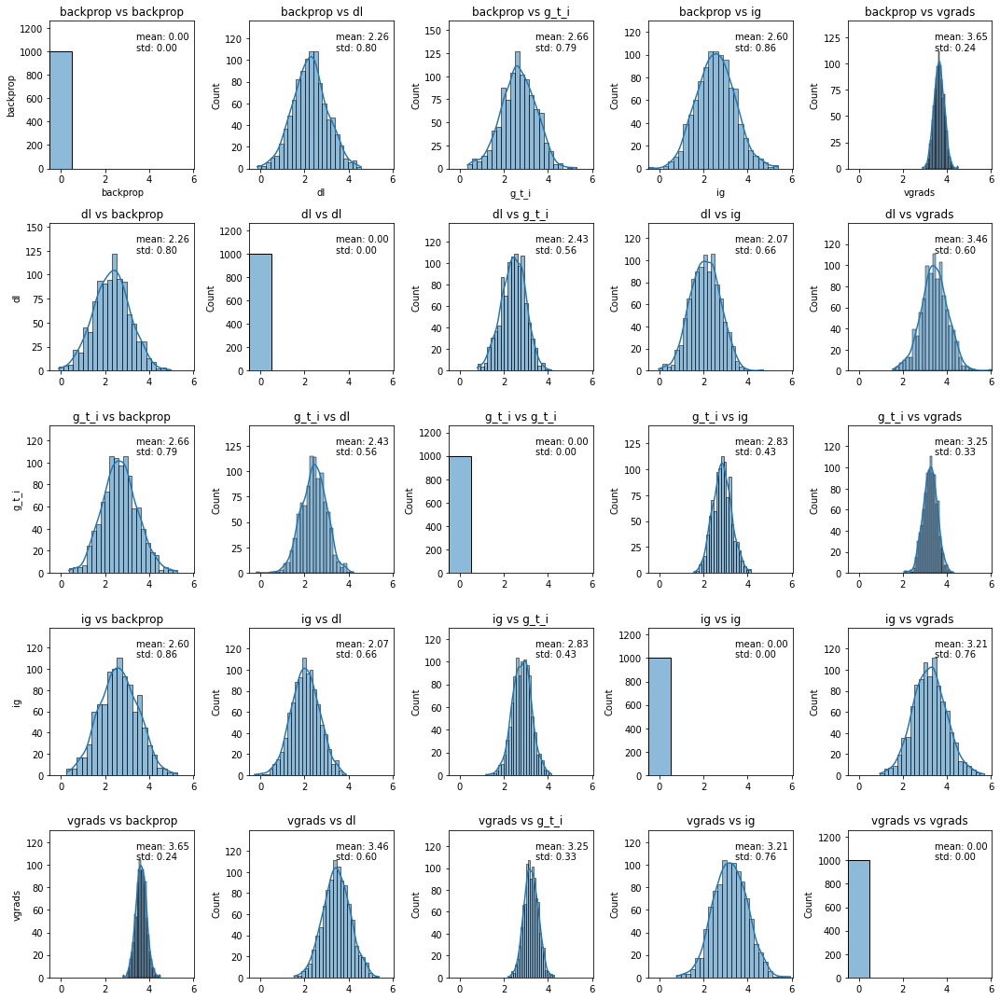

In [219]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_umap_2), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandParams Attack

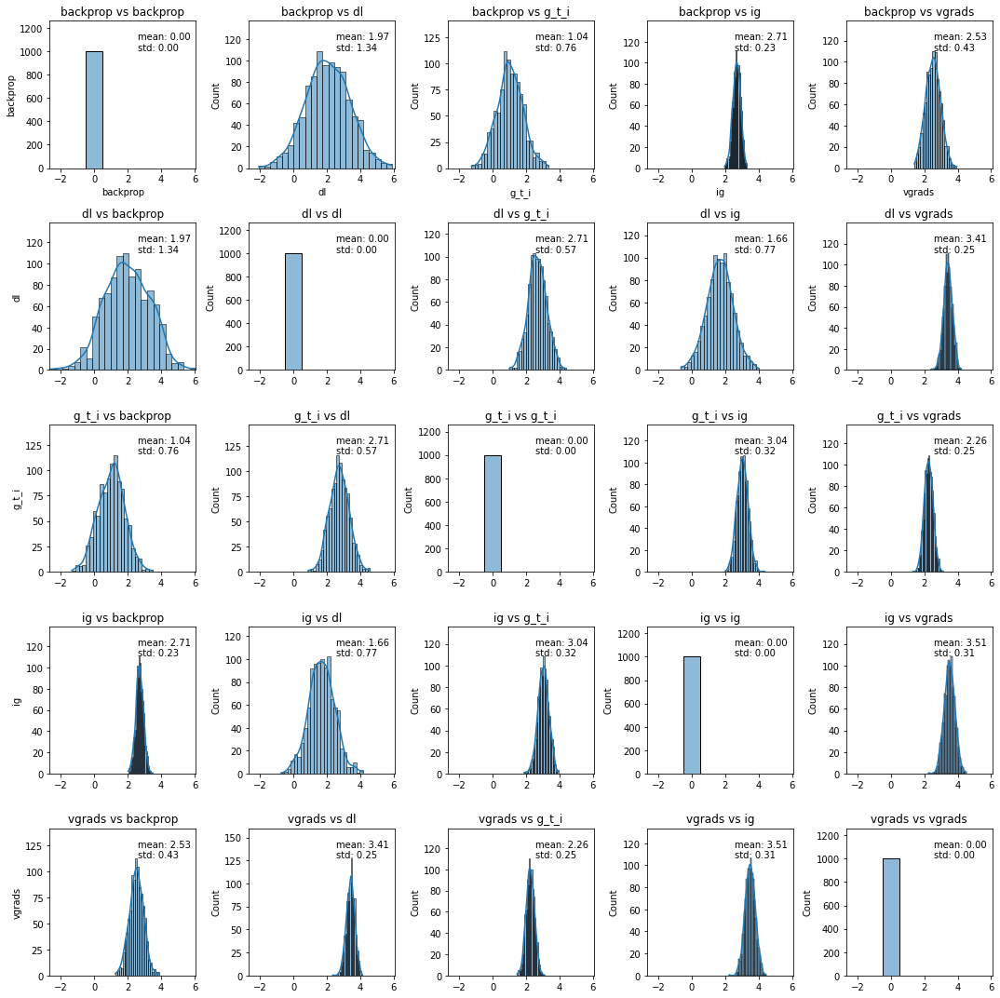

In [220]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_umap_3), 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandLabels (Difference)

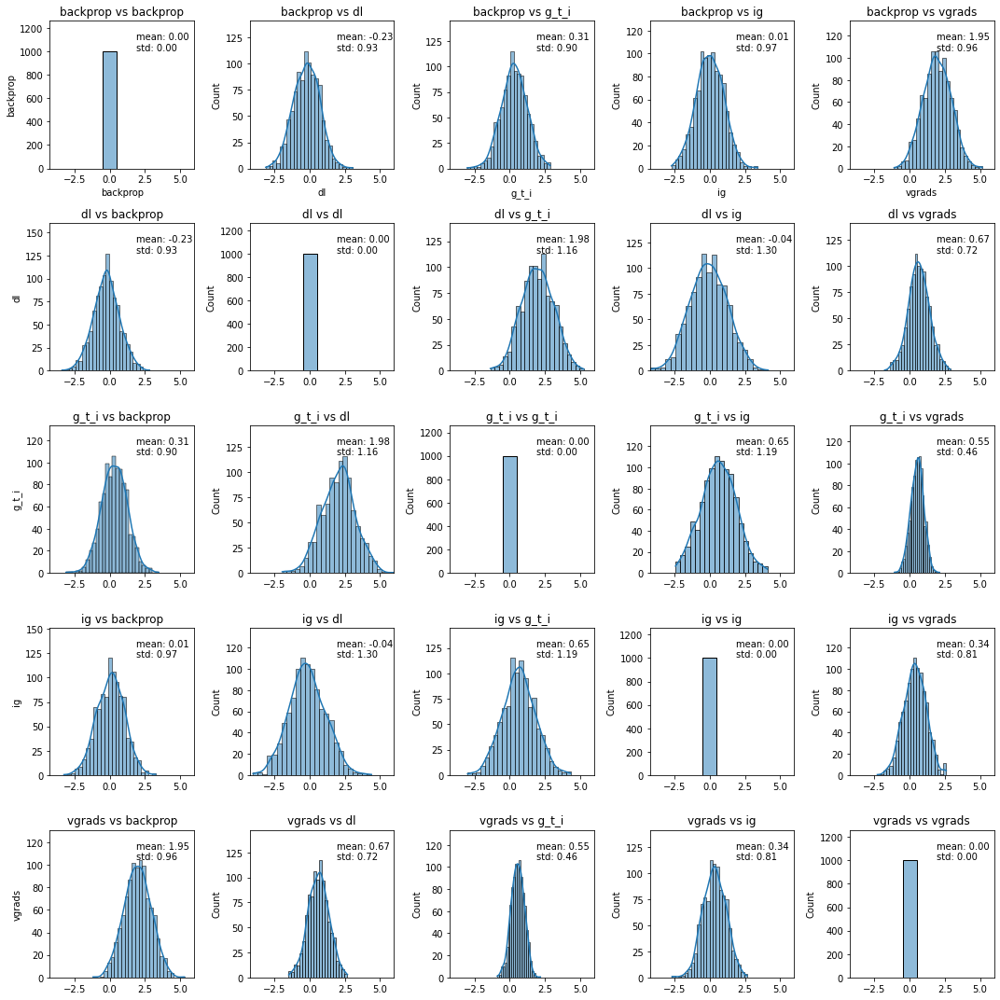

In [221]:
plot_gaussian_distributions(
    distances=difference_umap_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandParams (Difference)

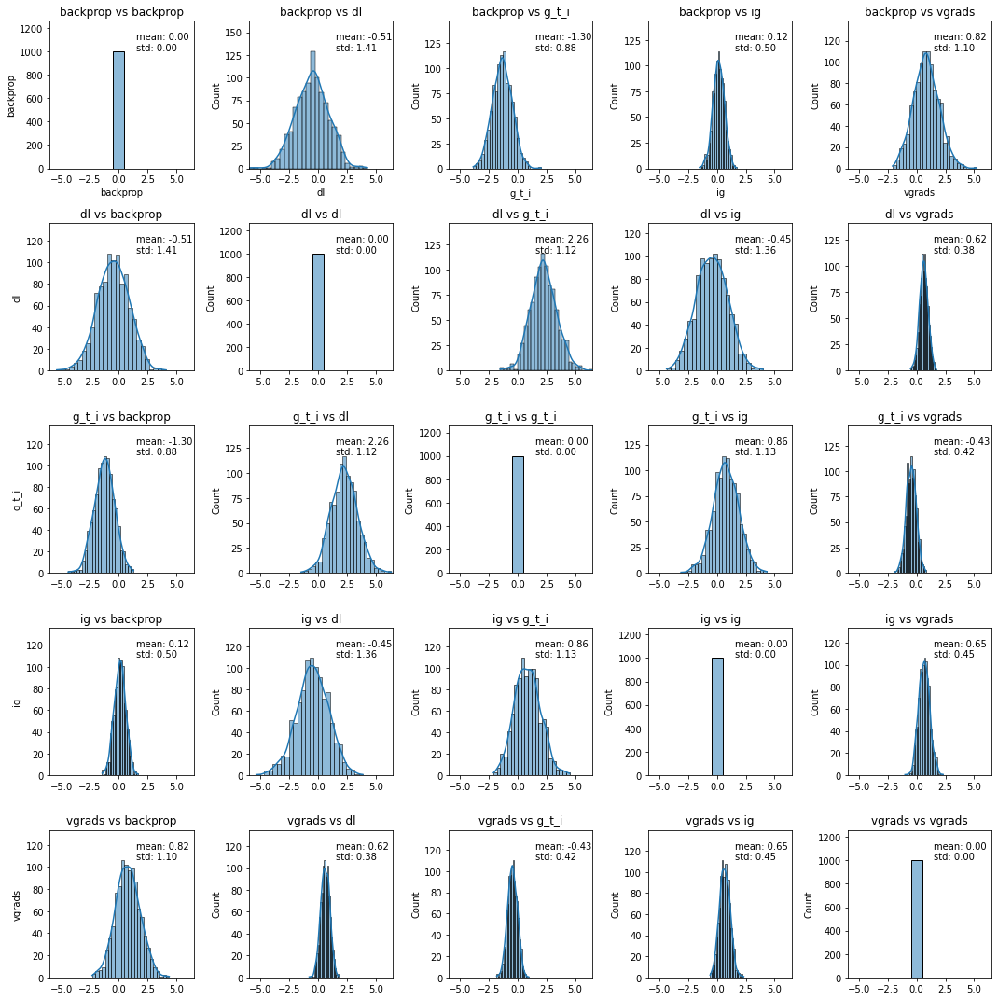

In [222]:
plot_gaussian_distributions(
    distances=difference_umap_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC
)

## kPCA (Linear)

### No Attack

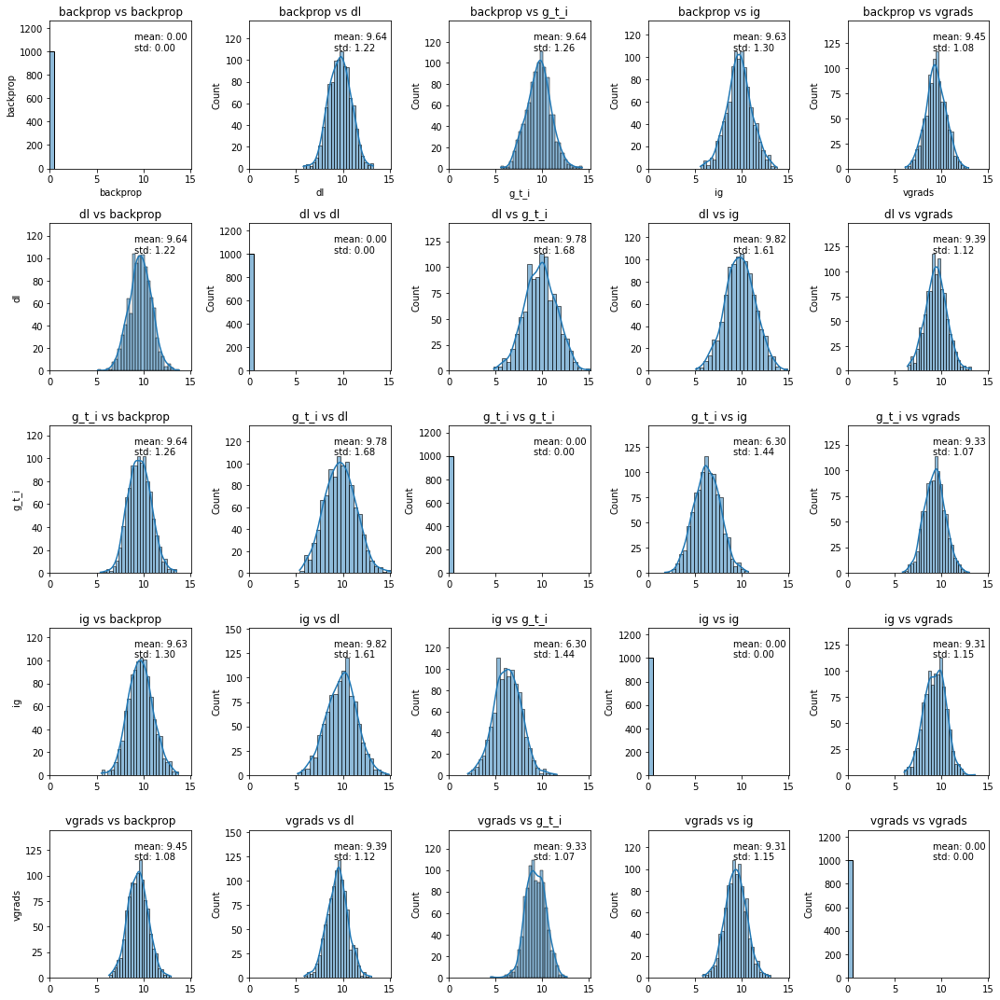

In [223]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_linear_1), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandLabels Attack

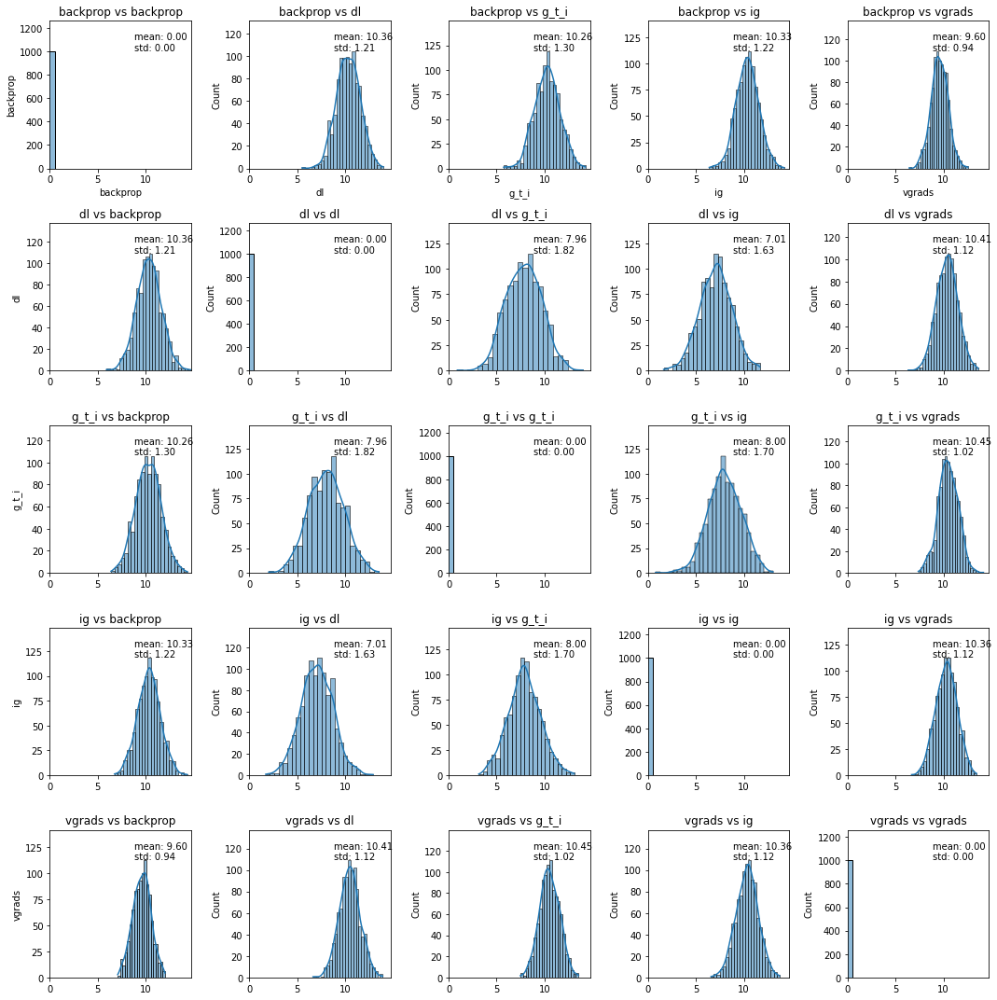

In [224]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_linear_2), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandParams Attack

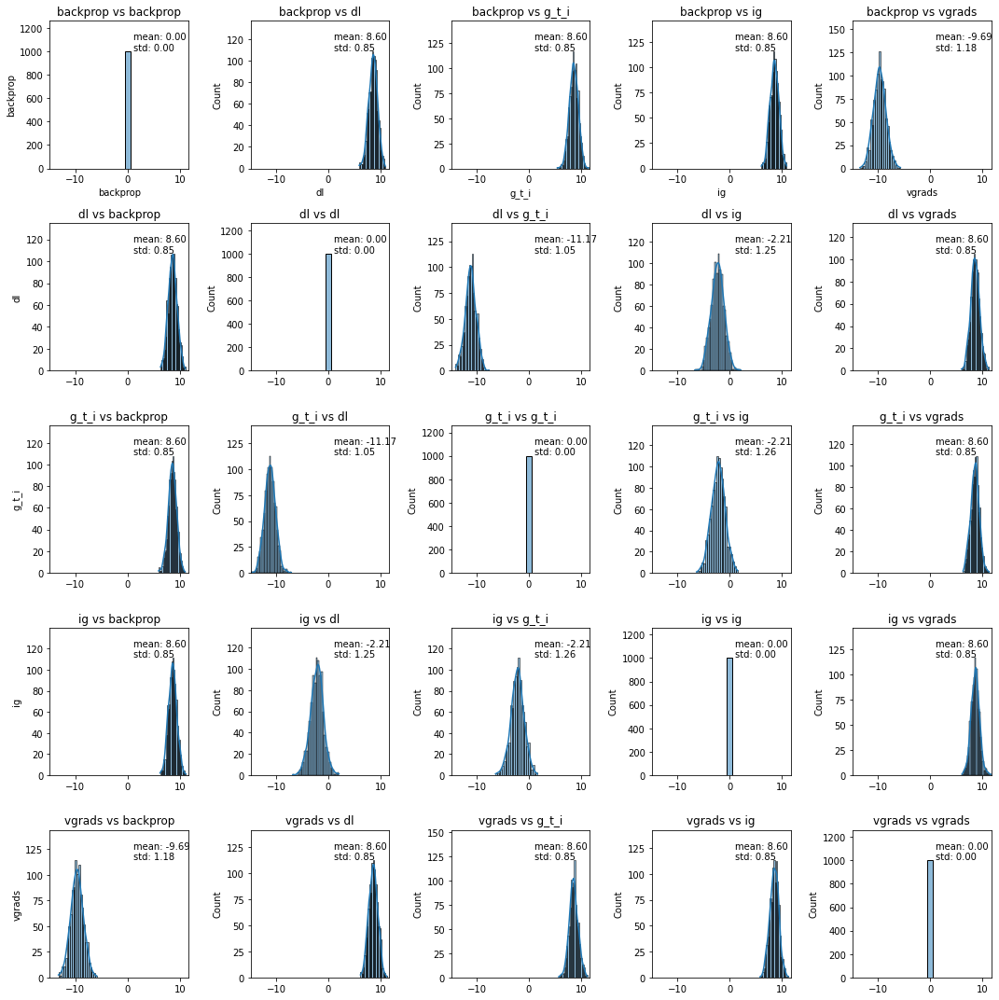

In [225]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_linear_3), 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandLabels (Difference)

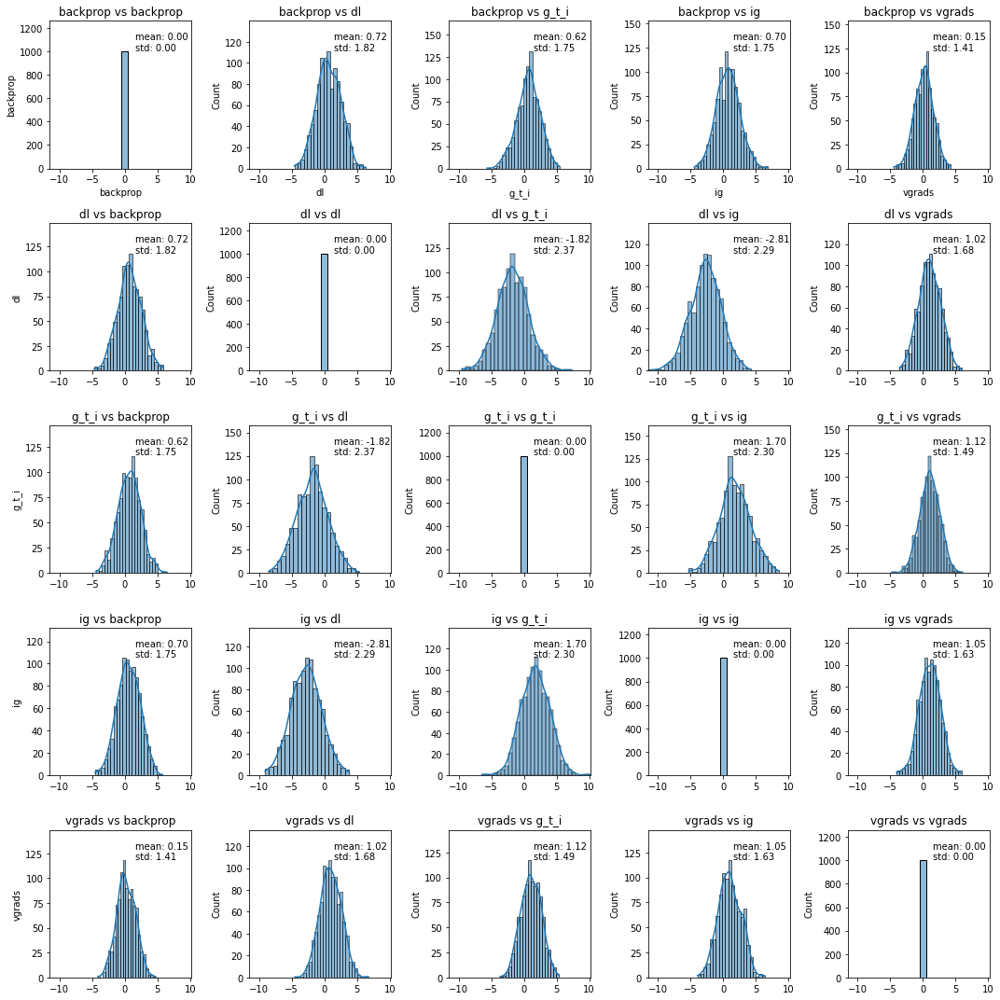

In [226]:
plot_gaussian_distributions(
    distances=difference_kpca_linear_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandParams (Difference)

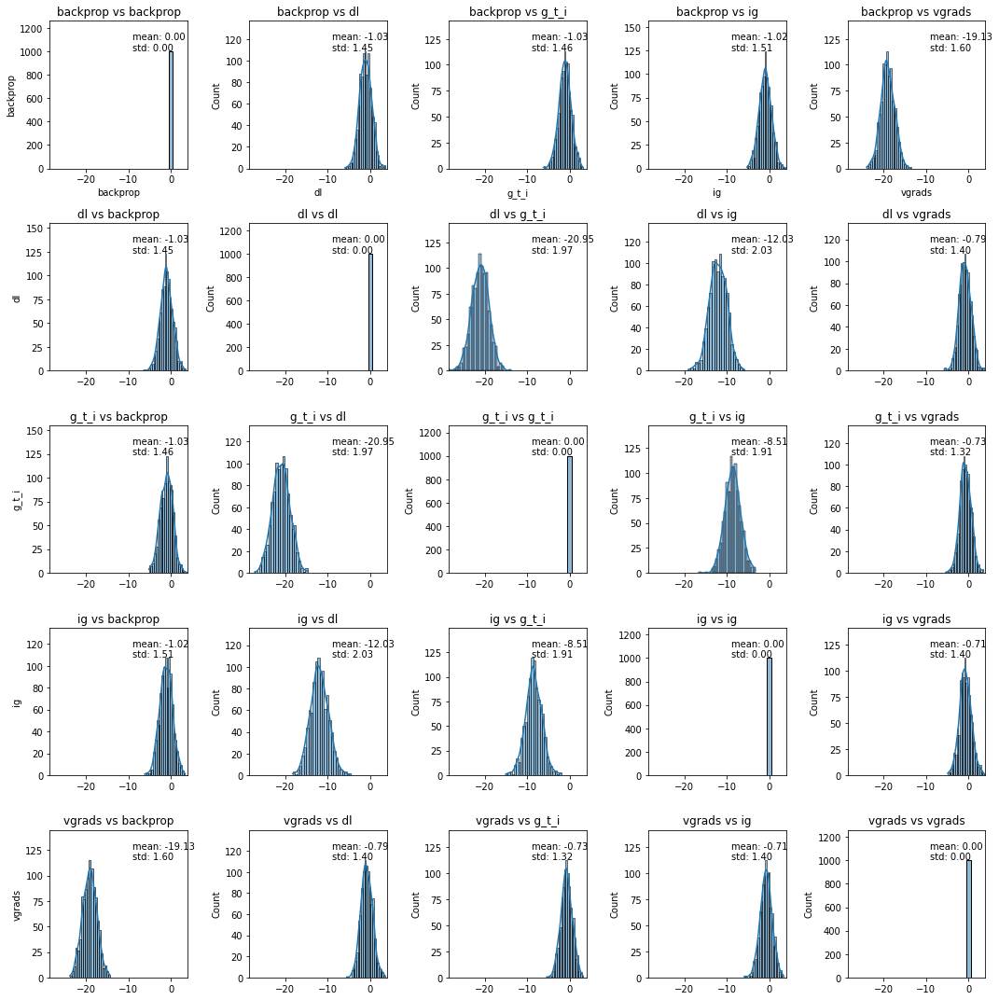

In [227]:
plot_gaussian_distributions(
    distances=difference_kpca_linear_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC
)

## kPCA (poly)

### No Attack

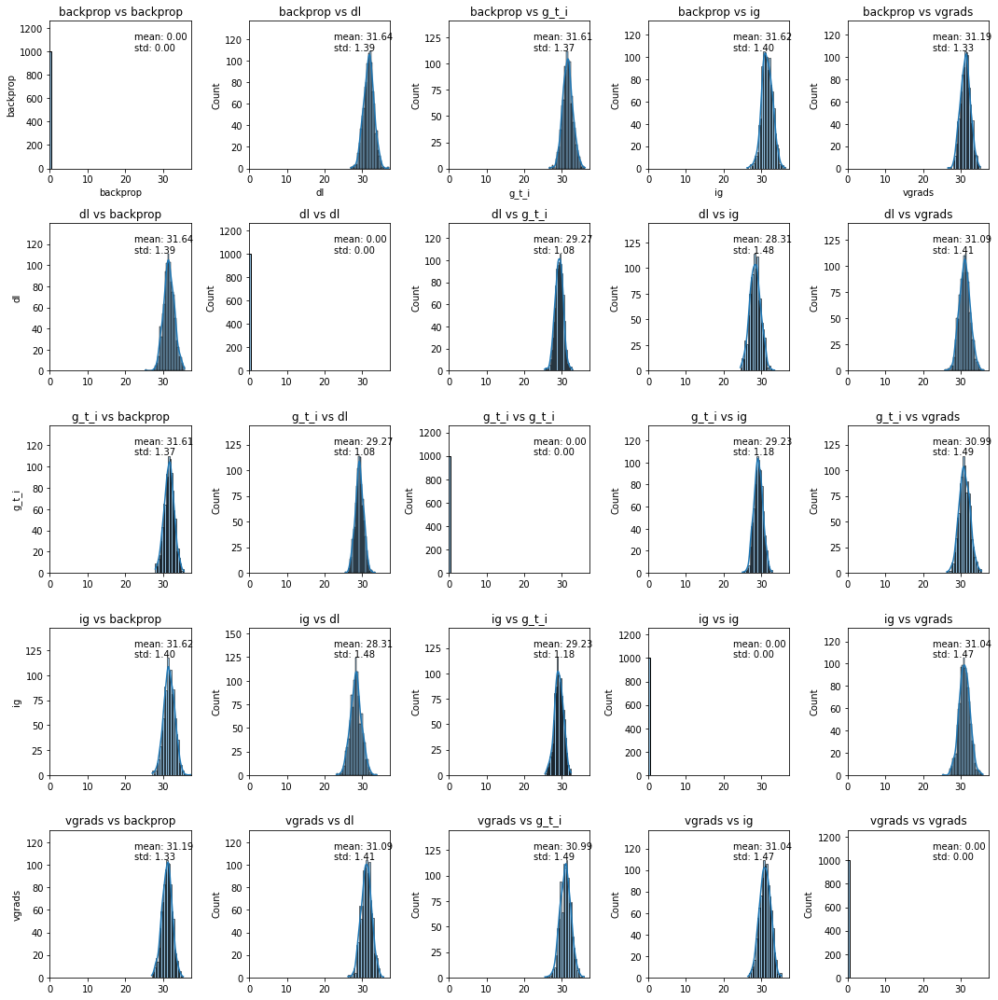

In [228]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_poly_1), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandLabels Attack

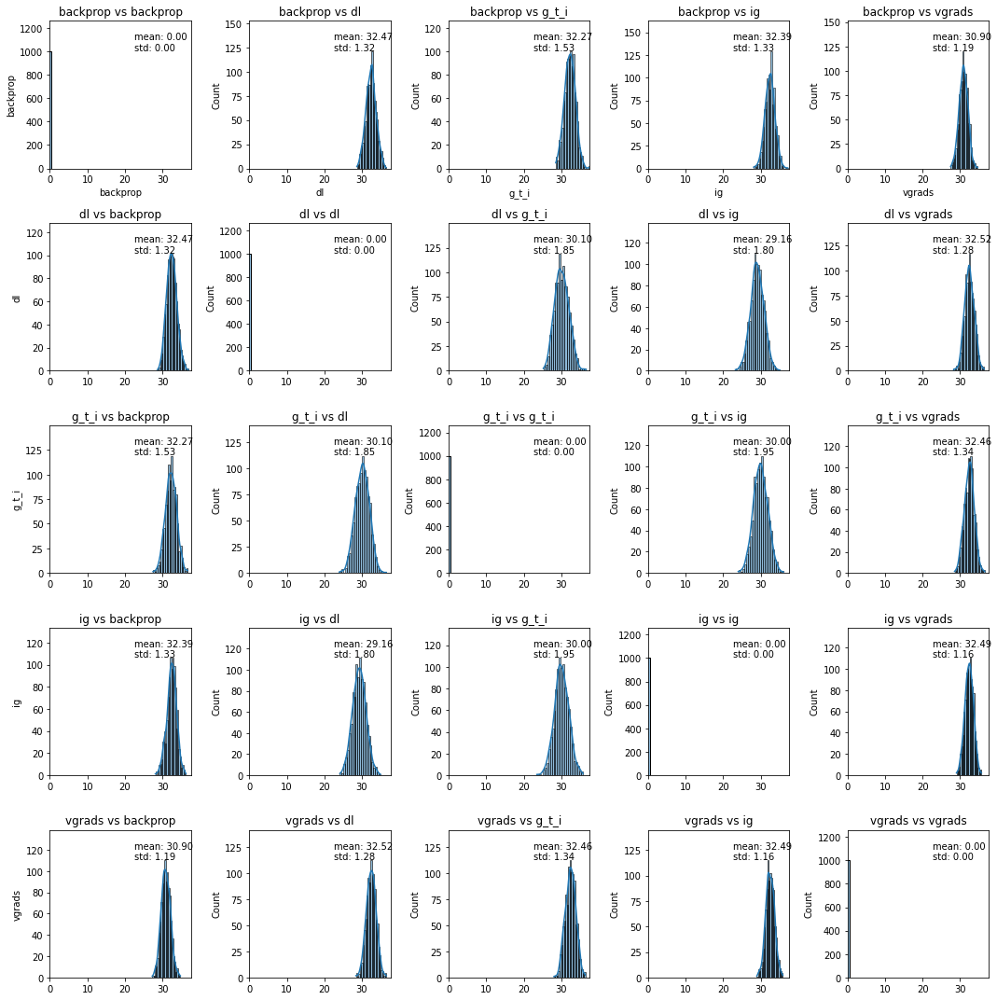

In [229]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_poly_2), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandParams Attack

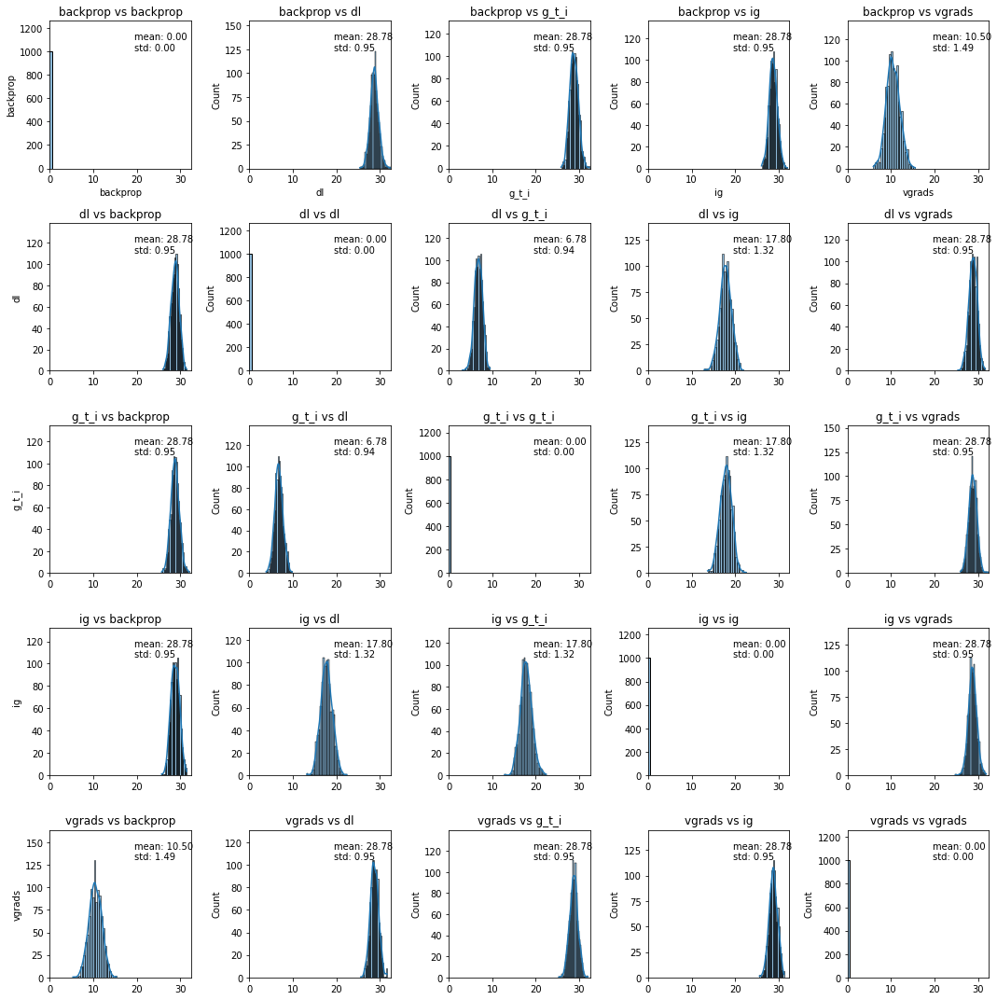

In [230]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_poly_3), 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandLabels (Difference)

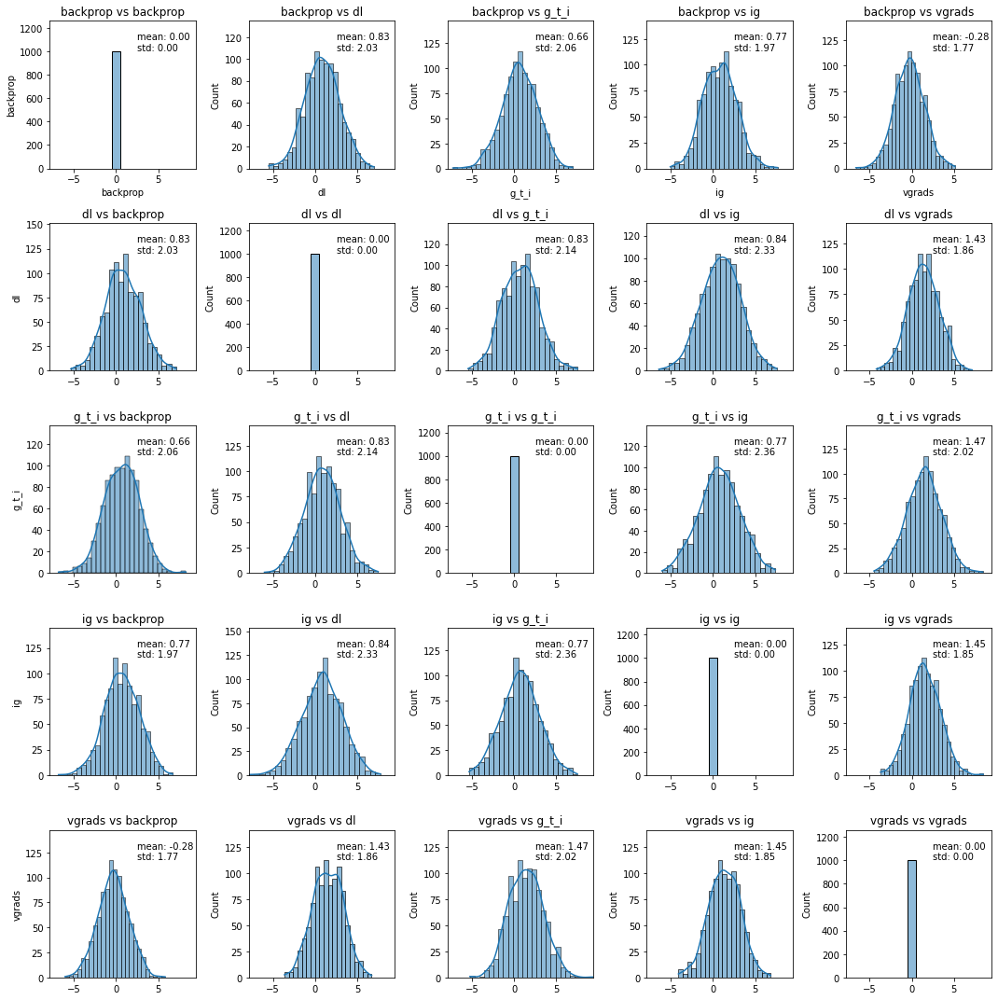

In [231]:
plot_gaussian_distributions(
    distances=difference_kpca_poly_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandParams (Difference)

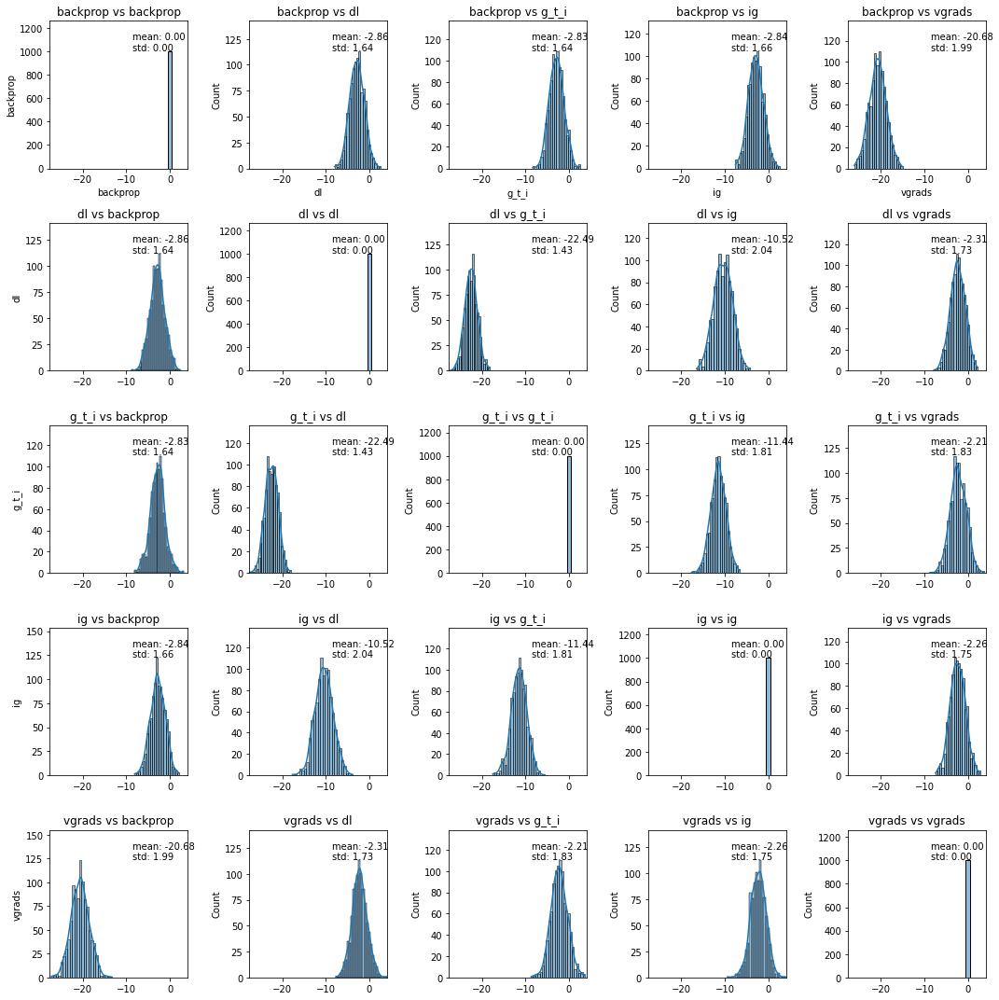

In [232]:
plot_gaussian_distributions(
    distances=difference_kpca_poly_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC
)

## kPCA (cosine)

### No Attack

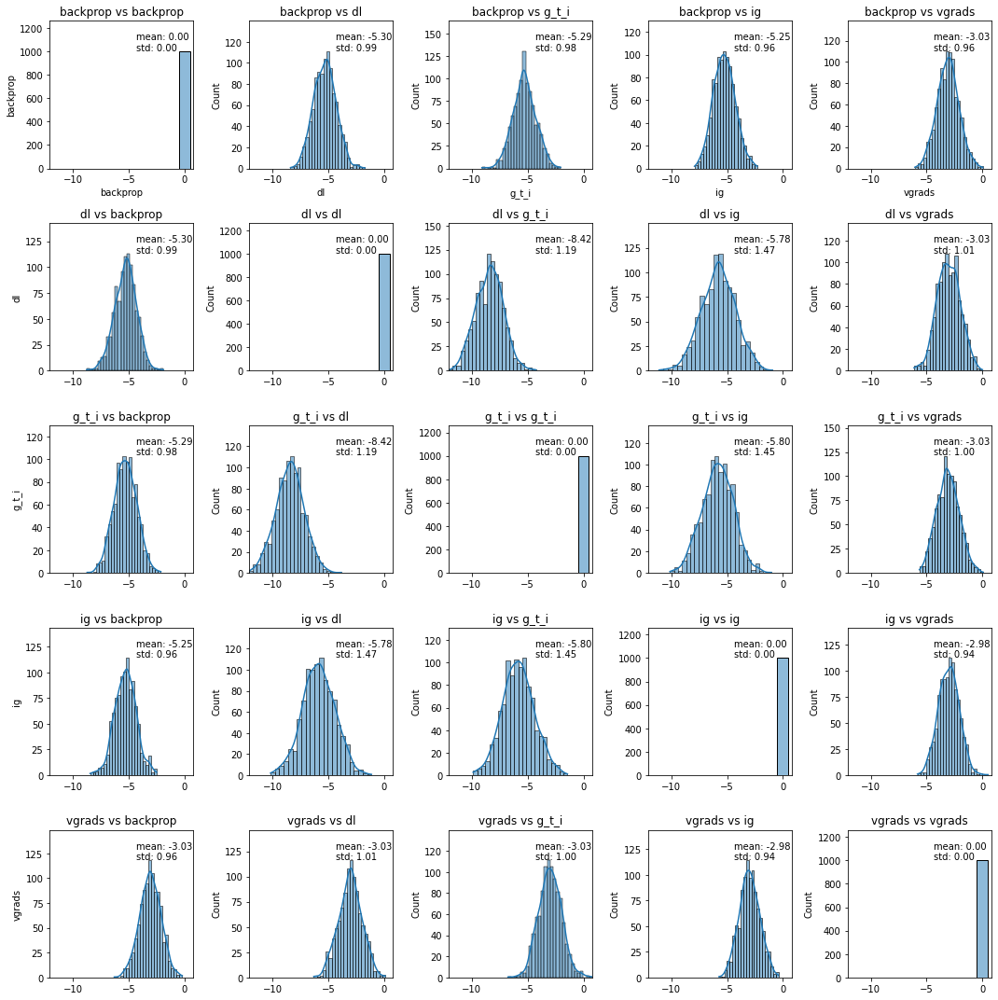

In [233]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_cosine_1), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandLabels Attack

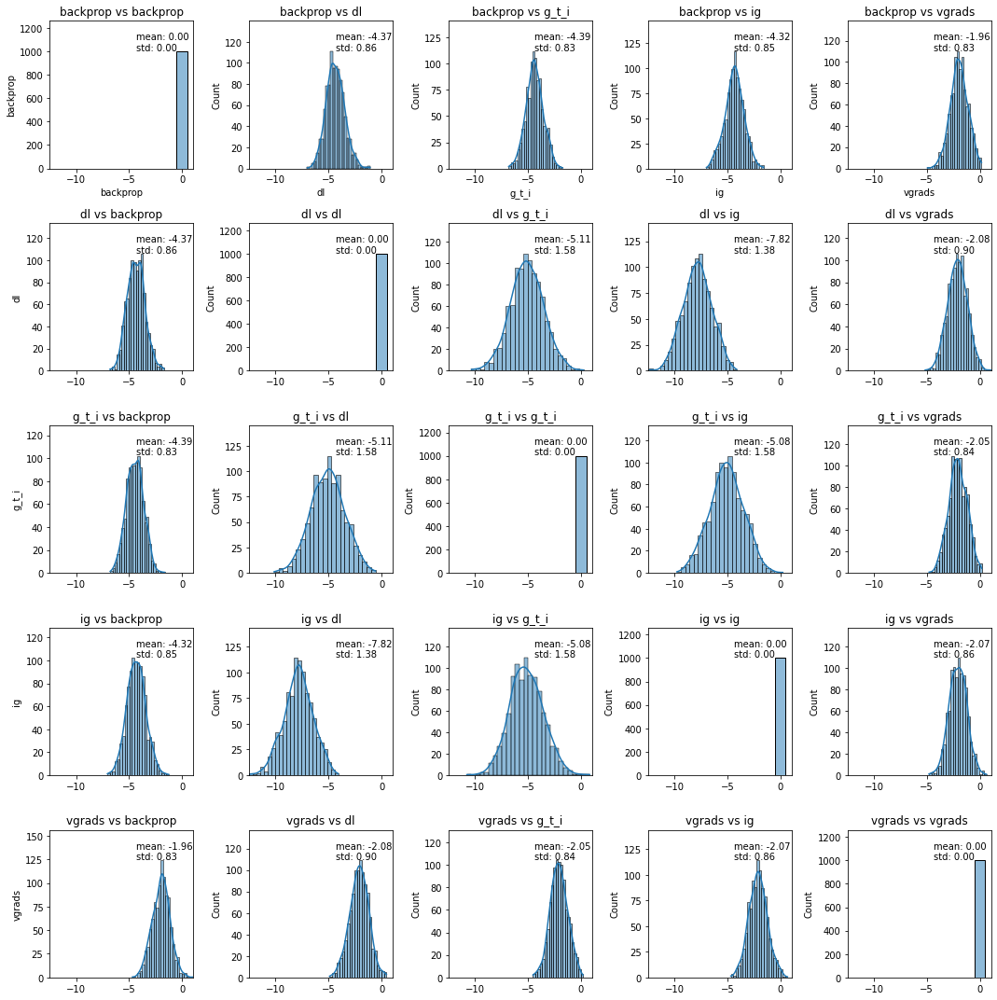

In [234]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_cosine_2), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandParams Attack

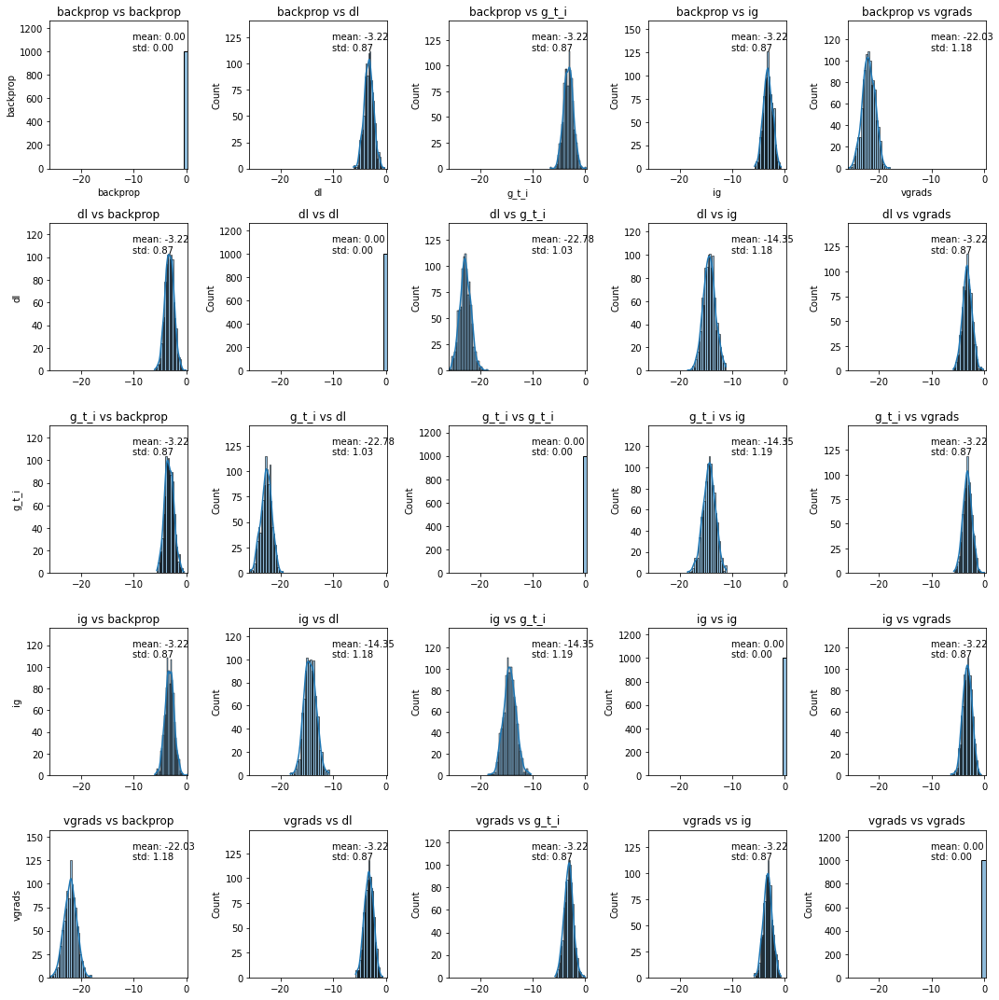

In [235]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_cosine_3), 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandLabels (Difference)

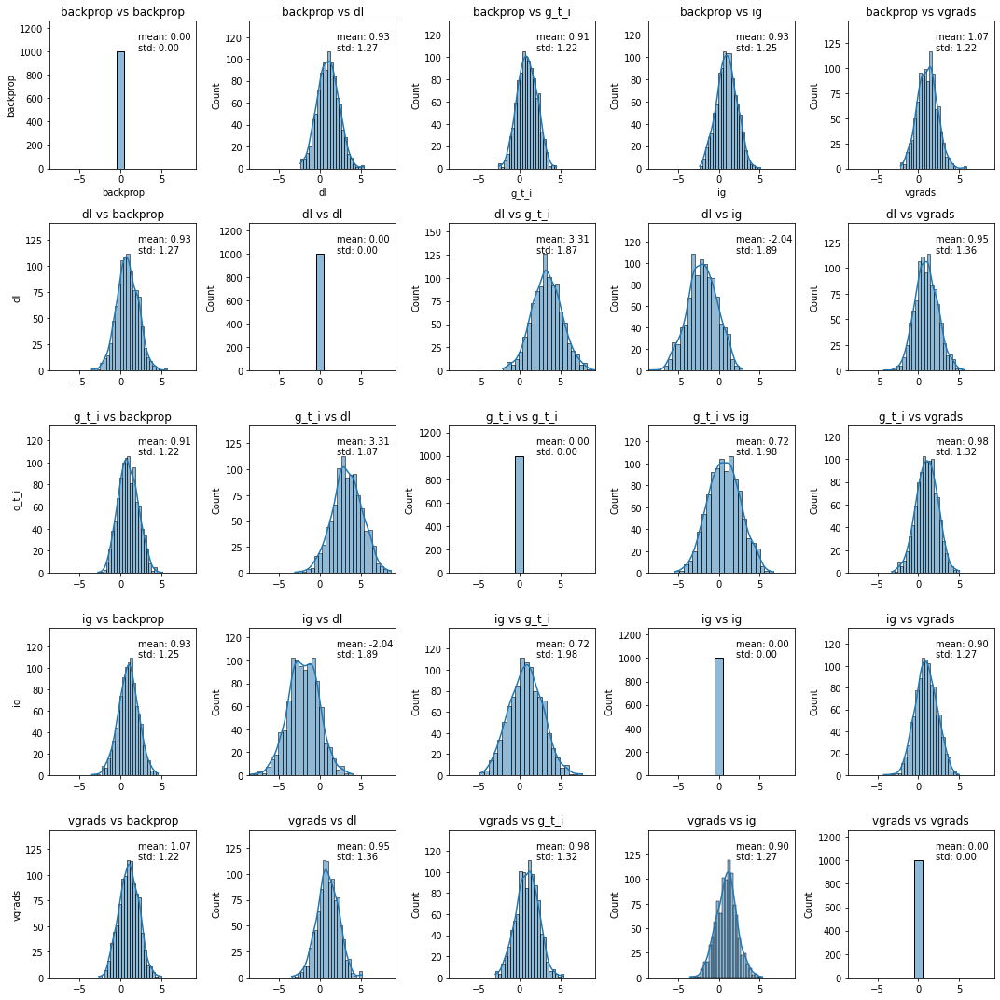

In [236]:
plot_gaussian_distributions(
    distances=difference_kpca_cosine_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandParams (Difference)

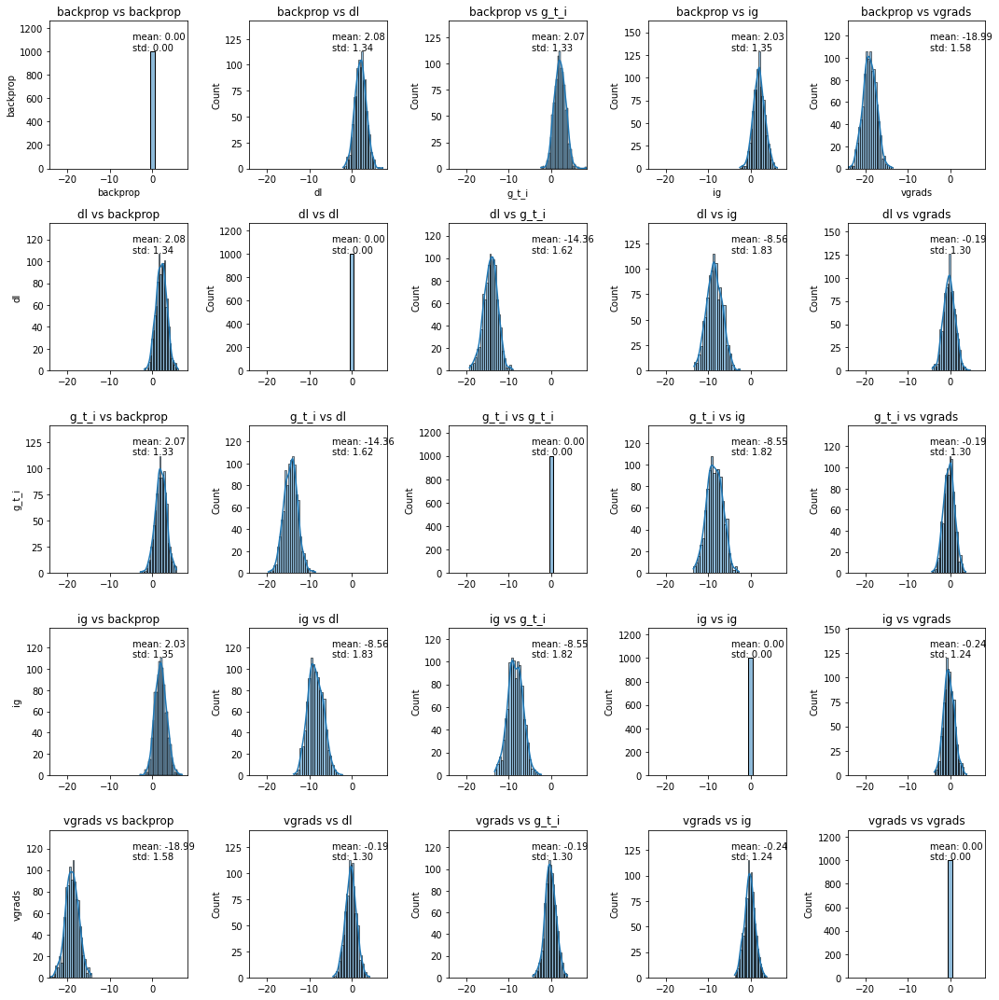

In [237]:
plot_gaussian_distributions(
    distances=difference_kpca_cosine_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC
)

## tSNE

### No Attack

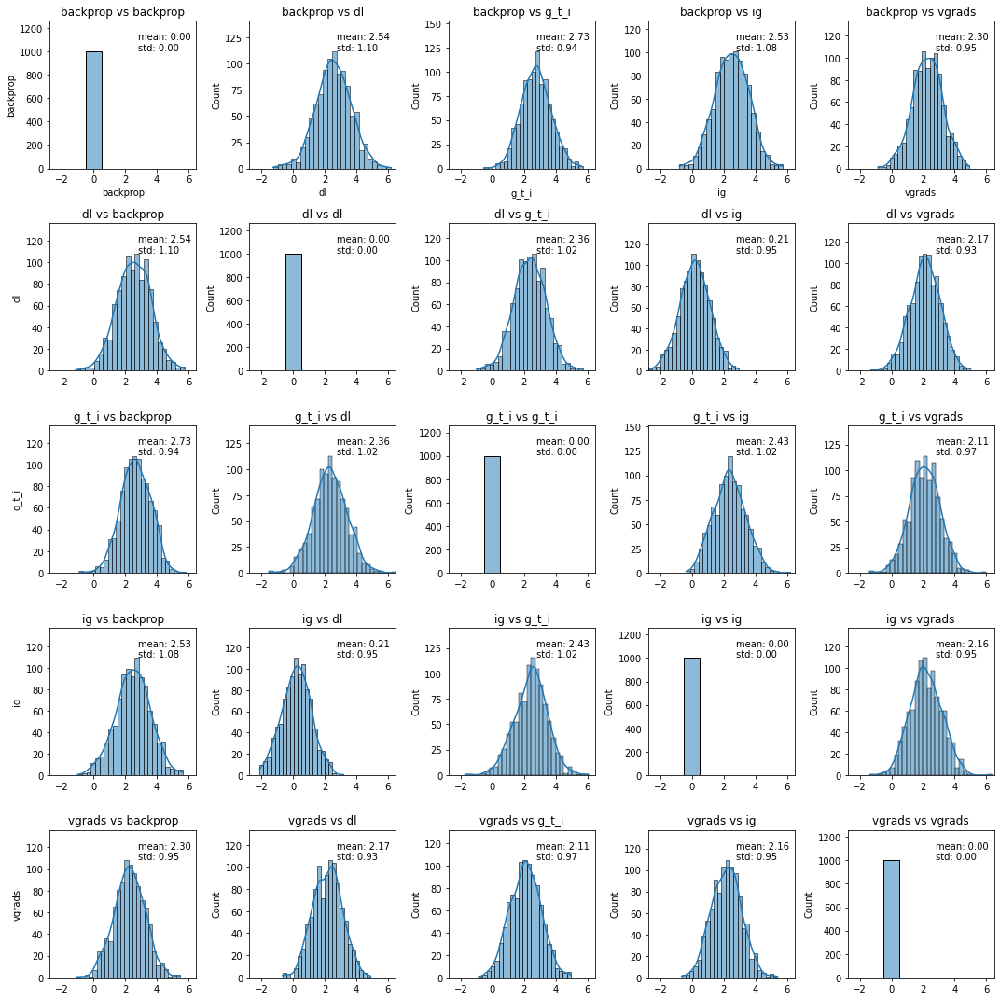

In [238]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_tsne_1), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandLabels Attack

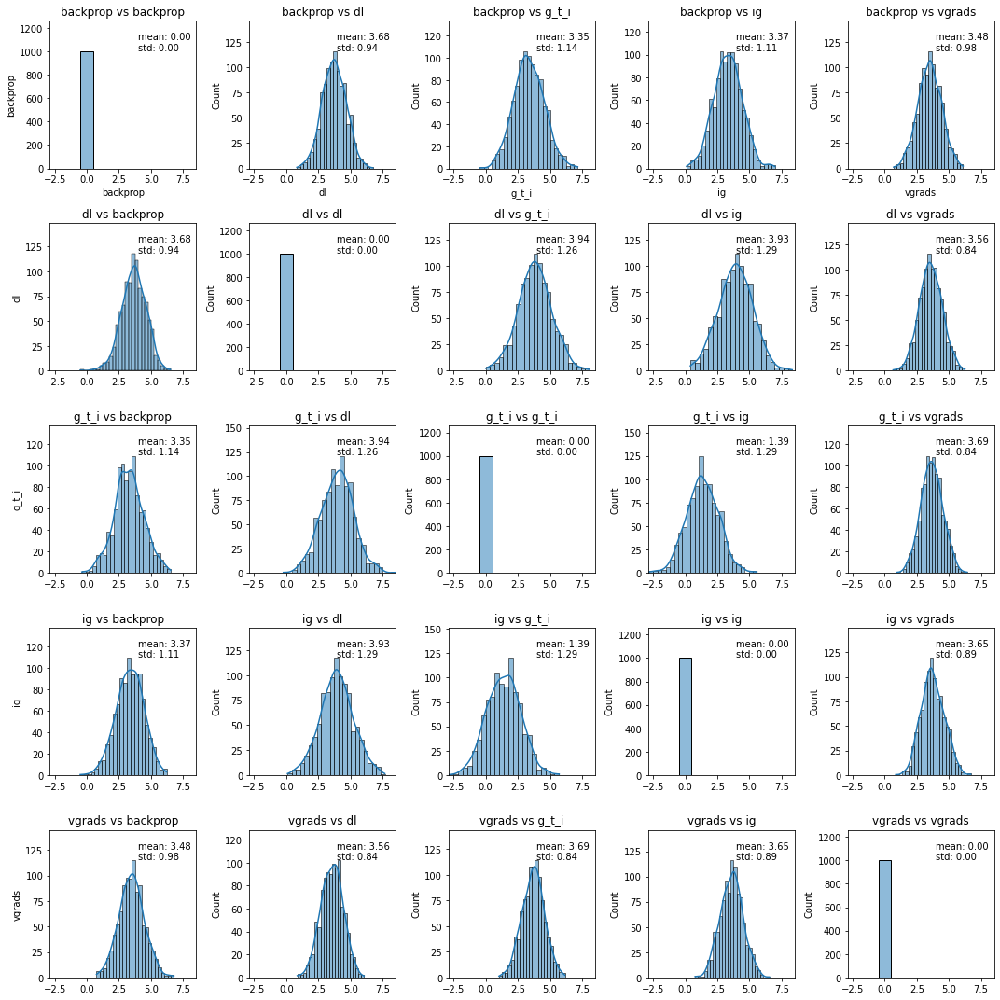

In [239]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_tsne_2), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandParams Attack

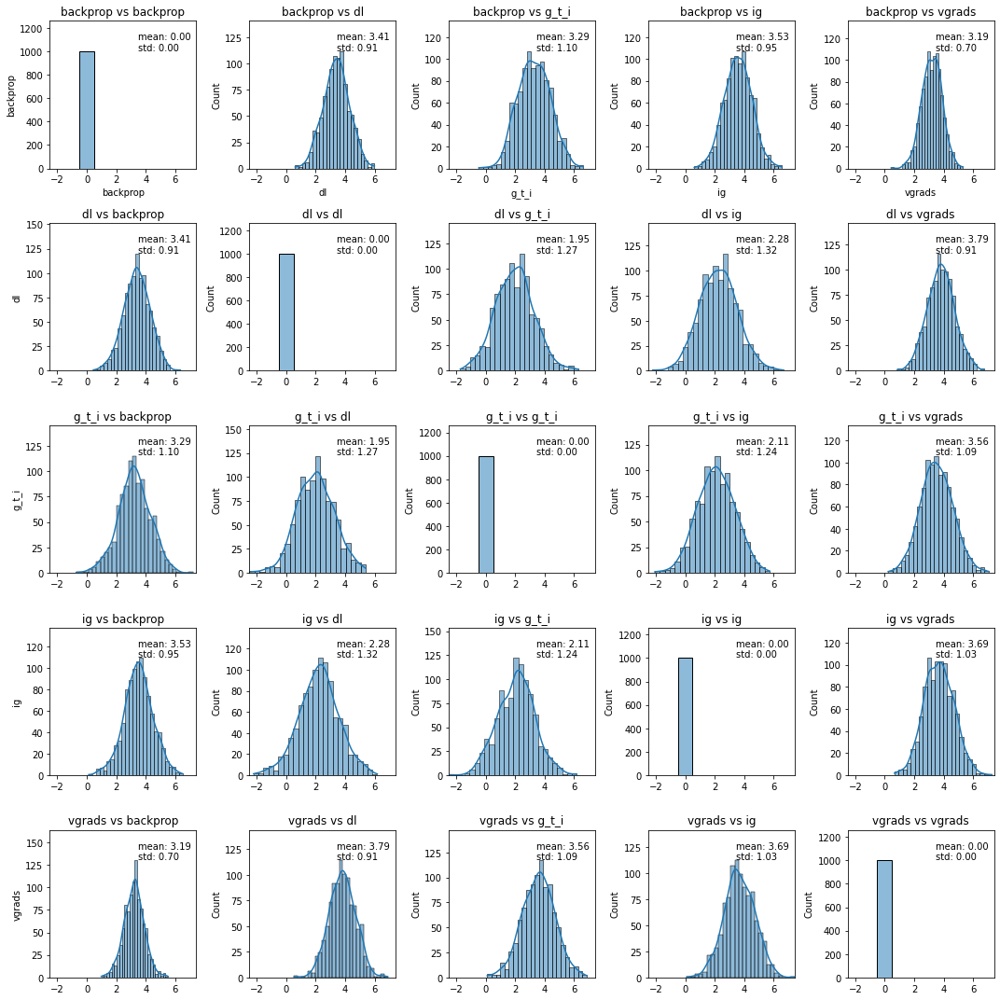

In [240]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_tsne_3), 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandLabels (Difference)

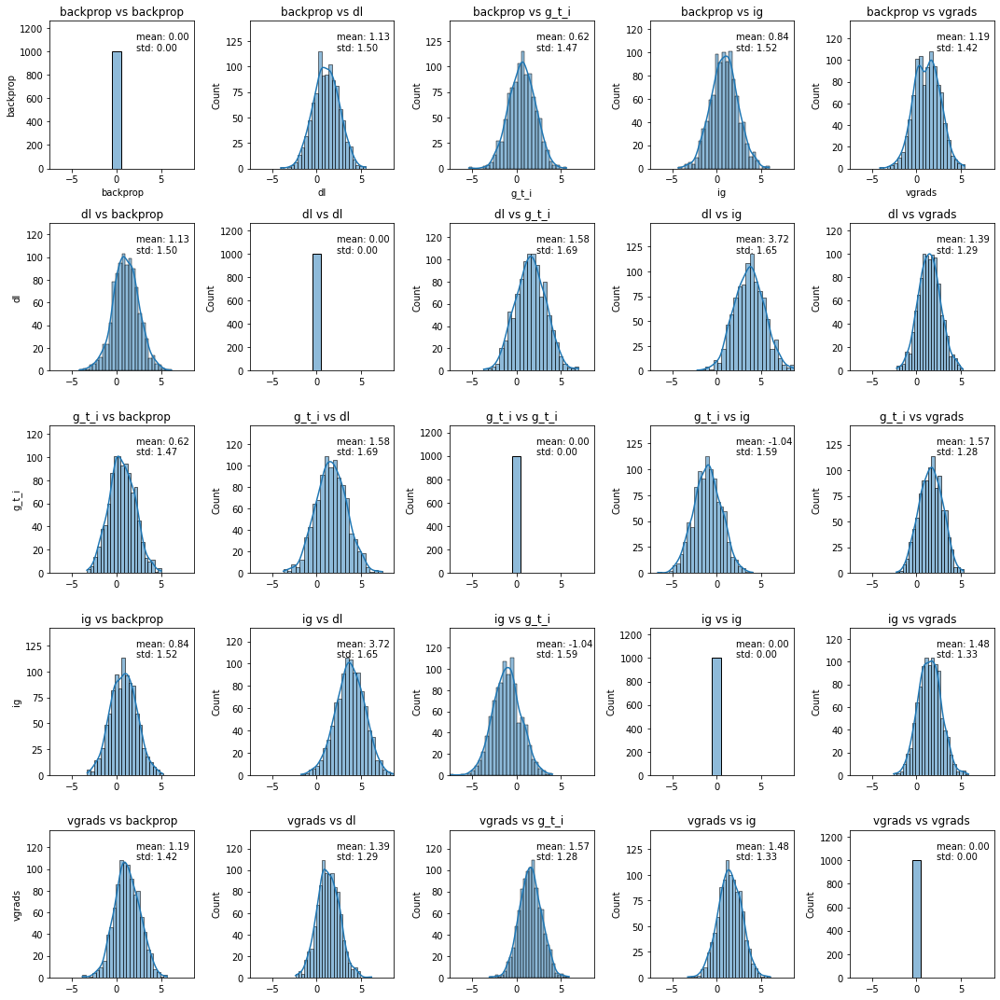

In [241]:
plot_gaussian_distributions(
    distances=difference_tsne_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandParams (Difference)

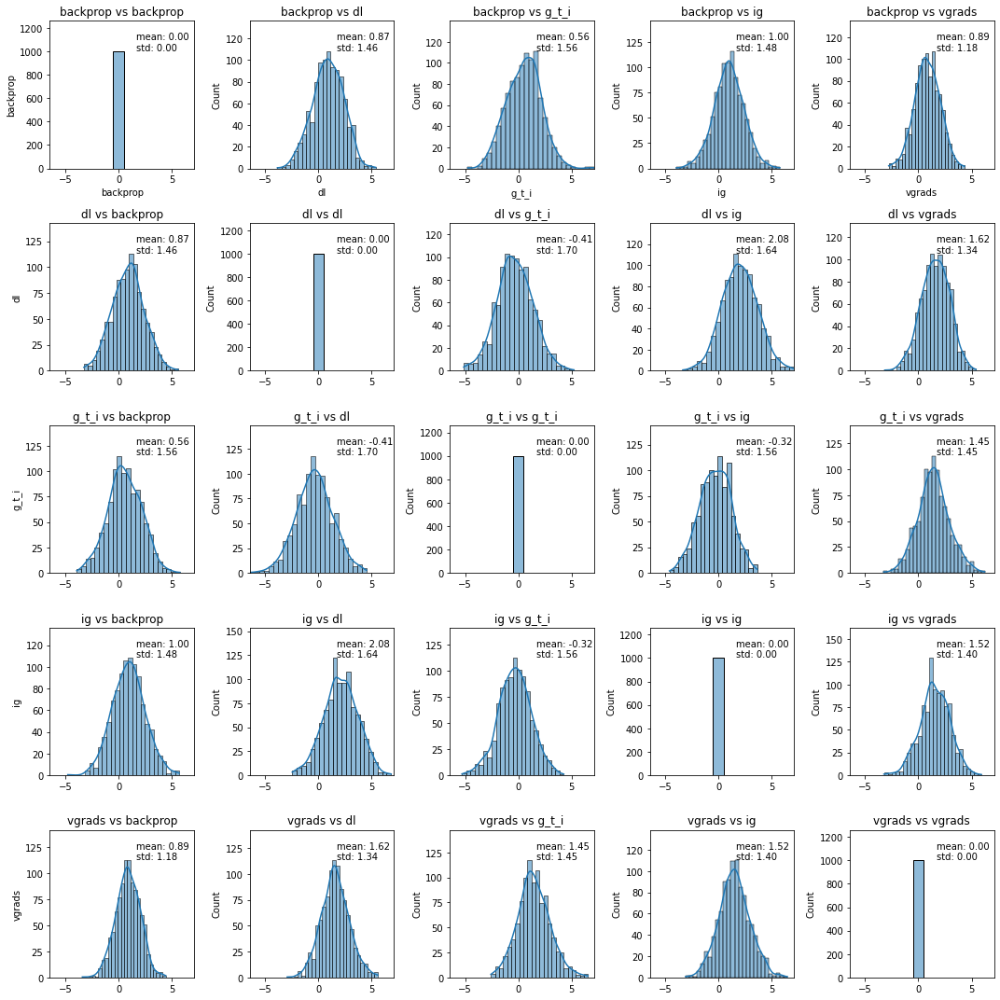

In [242]:
plot_gaussian_distributions(
    distances=difference_tsne_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC
)